<a href="https://colab.research.google.com/github/gaurav12091999/Netflix-Movie-and-TV-Shows-Clustering/blob/main/Copy_of_Netflix_Movies_and_TV_Shows.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -  **Netflix Movies And TV Shows Clustering**

---------------------------------------------



##### **Project Type**    - Unsupervised
##### **Contribution**    - Individually
Student Name : Gaurao Sonkusare

# **Project Summary -**

Netflix Movies and TV Shows Clustering is a data analysis and machine learning technique that Netflix uses to group their content into similar categories. This technique involves analyzing the various characteristics of each title, such as genre, cast and plot, and using algorithms to identify patterns and similarities. In this way, Netflix can provide its users with personalized recommendations based on their viewing history and preferences. The goal is to improve user engagement and satisfaction, which will lead to increased retention and company revenue.

Netflix Movies and TV Shows Clustering is a data-driven approach that Netflix uses to group its vast library of content into similar categories. The process involves collecting and analyzing various data points such as genre, cast, director, plot and other relevant features. Netflix will then use unsupervised machine learning algorithms to identify patterns and similarities between different titles.

Algorithms used in this process include clustering techniques such as k-means, hierarchical clustering, and principal component analysis (PCA). These algorithms help Netflix group movies and TV shows with similar features into distinct groups, each representing a unique genre or category.

The ultimate goal of this clustering is to improve the user experience on Netflix by providing personalized content recommendations to users based on their viewing history and preferences. By organizing the content library into clusters, Netflix can suggest titles to users that are more likely to match their interests, making it more likely that users will stay engaged with the platform.

In addition to improving user satisfaction, clustering also helps Netflix make data-driven decisions about content production and licensing. By understanding underlying trends and patterns in user behavior, Netflix can make informed decisions about which titles to produce or acquire and which to remove from its platform. This ultimately helps increase customer retention and company revenue.

# **GitHub Link -**

https://github.com/gaurav12091999/Netflix-Movie-and-TV-Shows-Clustering/blob/main/Copy_of_Netflix_Movies_and_TV_Shows.ipynb

# **Problem Statement**


* The ultimate goal of this clustering is to improve the user experience on Netflix by providing personalized content recommendations to users based on their viewing history and preferences. By organizing the content library into clusters, Netflix can suggest titles to users that are more likely to match their interests, making it more likely that users will stay engaged with the platform.

# **General Guidelines** : -

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.

     The additional credits will have advantages over other students during Star Student selection.

             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.


```
# Chart visualization code
```


*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries

# Necessary Libraries
#necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import matplotlib.cm as cm
from wordcloud import WordCloud, STOPWORDS
%matplotlib inline


#for nlp
from sklearn import preprocessing
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split, KFold
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
import scipy.cluster.hierarchy as sch


import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
# Load Dataset
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Un-Supervized  Learning/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [ ]:
# Dataset First Look
data.sample(5)


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
4722,s4723,TV Show,Paap-O-Meter,NaN,NaN,NaN,"November 20, 2018",2017,TV-Y7,1 Season,"Kids' TV, TV Comedies",A trio of sky-dwelling ghosts must travel to E...
5065,s5066,Movie,Ragini MMS 2,Bhushan Patel,"Sunny Leone, Saahil Prem, Parvin Dabas, Sandhy...",India,"May 31, 2019",2014,TV-MA,113 min,"Horror Movies, International Movies",The horror continues when Ragini's video goes ...
3504,s3505,TV Show,La Robe De Mariee Des Cieux,NaN,"Cyndi Wang, Leon Jay Williams, Chu Chung-heng,...",Taiwan,"November 15, 2019",2004,TV-MA,1 Season,"International TV Shows, Romantic TV Shows",After a chance encounter that ends on bad term...
2679,s2680,Movie,Heartthrob,Chris Sivertson,"Aubrey Peeples, Keir Gilchrist, Peter Facinell...",United States,"January 1, 2018",2017,TV-MA,87 min,Thrillers,"A shy, brilliant boy and a popular girl fall i..."
304,s305,Movie,Adú,Salvador Calvo,"Luis Tosar, Anna Castillo, Álvaro Cervantes, M...",Spain,"July 1, 2020",2020,TV-MA,120 min,"Dramas, International Movies","Near a Spanish town in northern Africa, a chil..."


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count

print('Total number of rows = ',data.shape[0] )
print('Total number of colums = ',data.shape[1] )


Total number of rows =  7787
Total number of colums =  12


### Dataset Information

In [ ]:
# Dataset Info

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count

data.duplicated().sum()

0

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count

data.isnull().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

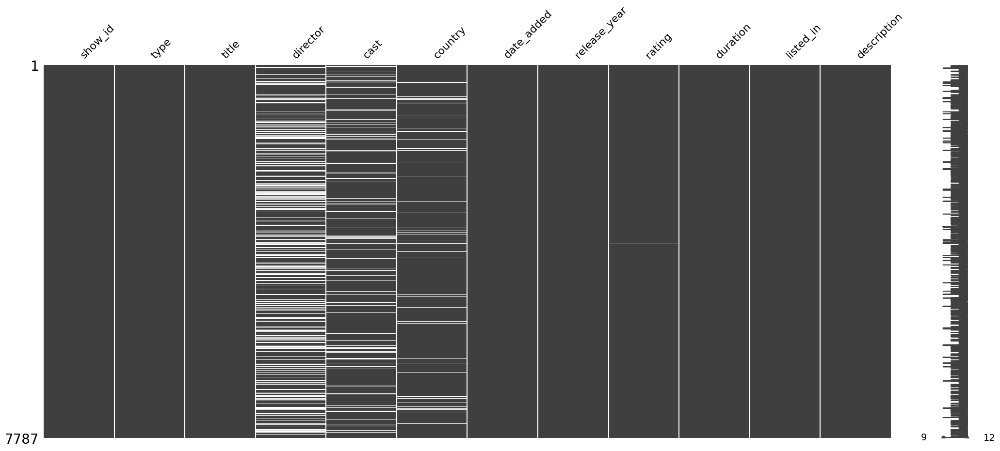

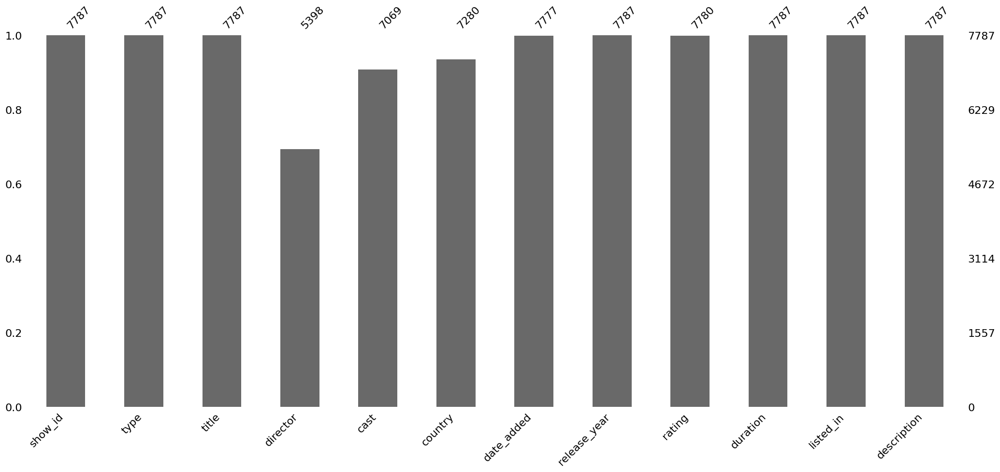

In [ ]:
# Visualizing the missing values

import pandas as pd
import missingno as msno
import matplotlib.pyplot as plt



# Visualize missing values using a matrix
msno.matrix(data)
plt.show()

# Visualize missing values using a bar chart
msno.bar(data)
plt.show()


<BarContainer object of 12 artists>

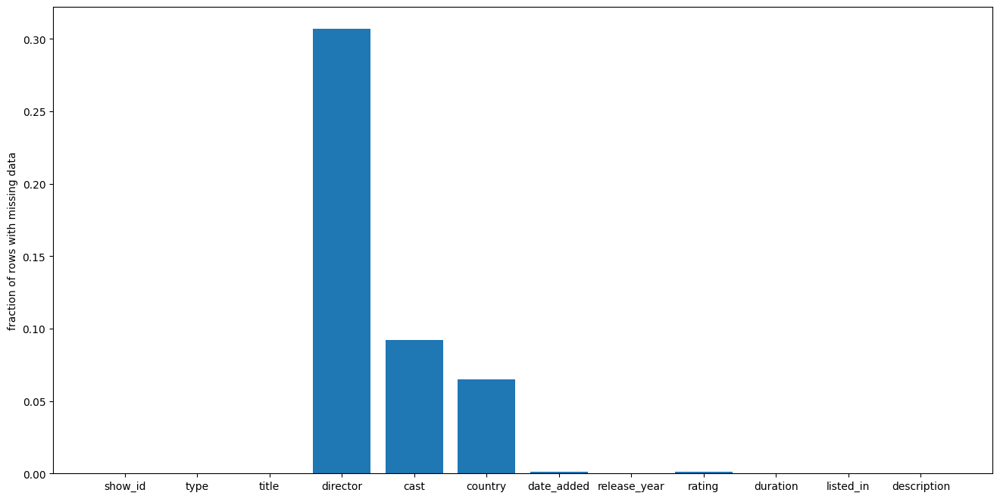

In [ ]:
# null value distribution
null_counts = data.isnull().sum()/len(data)
plt.figure(figsize=(16,8))
plt.xticks(np.arange(len(null_counts)),null_counts.index,rotation='horizontal')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

### What did you know about your dataset?

* The dataset contains information about Netflix movies and TV shows.

* There are 7787 entries (rows) in the dataset.

* The dataset consists of 12 columns, each representing a different attribute of the movies and TV shows.

* The dataset contains both numerical (release_year) and categorical (show_id, type, title, director, cast, country, date_added, rating, duration, listed_in, description) columns.

* The dataset has some missing values in columns such as director, cast, country, date_added, and rating.


As we can check most of the columns are not having any missing of null value except
- Director (2389)
- Cast (718)
- Country (507)
- Date_added (10)
- Rating (7)

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns

data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
data.describe(include='all')

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
count,7787,7787,7787,5398,7069,7280,7777,7787.000000,7780,7787,7787,7787
unique,7787,2,7787,4049,6831,681,1565,NaN,14,216,492,7769
top,s1,Movie,3%,"Raúl Campos, Jan Suter",David Attenborough,United States,"January 1, 2020",NaN,TV-MA,1 Season,Documentaries,Multiple women report their husbands as missin...
freq,1,5377,1,18,18,2555,118,NaN,2863,1608,334,3
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.932580,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.757395,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1925.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2013.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2017.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2018.000000,NaN,NaN,NaN,NaN


### Variables Description

* show_id: A unique identifier for each show.

* type: Specifies whether the entry is a movie or a TV show.

* title: The title of the movie or TV show.

* director: The director(s) of the movie or TV show.

* cast: The cast members of the movie or TV show.

* country: The country or countries where the movie or TV show was produced.

* date_added: The date when the movie or TV show was added to Netflix.

* release_year: The year when the movie or TV show was released.

* rating: The rating assigned to the movie or TV show.

* duration: The duration of the movie or TV show.

* listed_in: The genre(s) or category(s) the movie or TV show belongs to.
description: A brief description of the movie or TV show.

### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.

for i in data.columns.tolist():
  print("No. of unique values in ",i,"is",data[i].nunique(),".")

No. of unique values in  show_id is 7787 .
No. of unique values in  type is 2 .
No. of unique values in  title is 7787 .
No. of unique values in  director is 4049 .
No. of unique values in  cast is 6831 .
No. of unique values in  country is 681 .
No. of unique values in  date_added is 1565 .
No. of unique values in  release_year is 73 .
No. of unique values in  rating is 14 .
No. of unique values in  duration is 216 .
No. of unique values in  listed_in is 492 .
No. of unique values in  description is 7769 .


## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# converting the cast column into a list
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# Write your code to make your dataset analysis ready.

# Check for missing values
print(data.isnull().sum())

# Fill missing values
data['director'].fillna('Unknown', inplace=True)
data['cast'].fillna('Unknown', inplace=True)
data['country'].fillna('Unknown', inplace=True)



show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64


In [ ]:
#'date_added' and 'rating' contains an lower and not much important portion of the data so we will drop them from our analysis.
data.dropna(subset=['date_added','rating'],inplace=True)

In [ ]:
# Drop rows with missing values
data.dropna(inplace=True)

# Verify if missing values have been handled
print(data.isnull().sum())

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7770 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7770 non-null   object
 1   type          7770 non-null   object
 2   title         7770 non-null   object
 3   director      7770 non-null   object
 4   cast          7770 non-null   object
 5   country       7770 non-null   object
 6   date_added    7770 non-null   object
 7   release_year  7770 non-null   int64 
 8   rating        7770 non-null   object
 9   duration      7770 non-null   object
 10  listed_in     7770 non-null   object
 11  description   7770 non-null   object
dtypes: int64(1), object(11)
memory usage: 789.1+ KB


In [ ]:
data['rating'].value_counts()

TV-MA       2861
TV-14       1928
TV-PG        804
R            665
PG-13        386
TV-Y         279
TV-Y7        270
PG           247
TV-G         194
NR            83
G             39
TV-Y7-FV       6
UR             5
NC-17          3
Name: rating, dtype: int64

### What all manipulations have you done and insights you found?

* This section focuses on preparing the dataset for analysis by addressing missing values. The following steps are taken:
   * Converting the 'cast' column into a list: The 'cast' column is converted into a list format,  to facilitate further processing or analysis.
Checking for missing values: The code snippet data.isnull().sum() is used to determine the number of missing values in each column of the dataset.
   * Filling missing values: The missing values in the 'director', 'cast', and 'country' columns are filled with the value 'Unknown' using the fillna() method. This ensures that these columns have a non-null value for all entries.
   * Dropping unnecessary columns: The 'date_added' and 'rating' columns are deemed to have lower importance and are dropped from the analysis. This is done using the dropna() method with the subset parameter specifying the columns to consider.
   * Dropping rows with missing values: The dropna() method is used again, this time without specifying any subset, to drop rows that still have missing values after the previous steps.
   * Finally, data.isnull().sum() is used again to check if any missing values remain in the dataset. If the output shows zeros for all columns, it means that missing values have been successfully handled.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1--Bar Plot - Show Count of Movies and TV Shows:

In [ ]:
num_movies = data[data['type'] == 'Movie'].shape[0]
num_tv_shows = data[data['type'] == 'TV Show'].shape[0]

print("Number of movies:", num_movies)
print("Number of TV shows:", num_tv_shows)


Number of movies: 5372
Number of TV shows: 2398


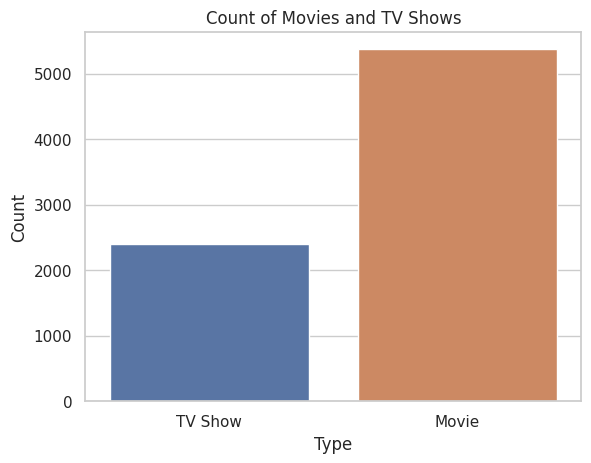

In [ ]:
# Chart - 1 visualization code

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

sns.countplot(x='type', data=data)
plt.xlabel('Type')
plt.ylabel('Count')
plt.title('Count of Movies and TV Shows')
plt.show()

##### 1. Why did you pick the specific chart?

 The countplot is a suitable choice for visualizing the count of movies and TV shows in the dataset due to its ability to handle categorical data and effectively present the frequency of each category.

##### 2. What is/are the insight(s) found from the chart?

* The chart displays the count of movies and TV shows in the dataset.
* The majority of the content in the dataset is likely to be movies, as indicated by the higher count in the 'Movies' category compared to the 'TV Shows' category.
* This distribution provides an overview of the content composition and the relative representation of movies and TV shows in the dataset.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

 This information can be useful for understanding the content composition on Netflix and making decisions related to content acquisition, production, and licensing. It helps in identifying the popularity of different types of content and understanding user preferences.

#### Chart - 2--Percentage Distribution of Ratings

In [ ]:
rating_counts = data['rating'].value_counts()
print(rating_counts)

TV-MA       2861
TV-14       1928
TV-PG        804
R            665
PG-13        386
TV-Y         279
TV-Y7        270
PG           247
TV-G         194
NR            83
G             39
TV-Y7-FV       6
UR             5
NC-17          3
Name: rating, dtype: int64


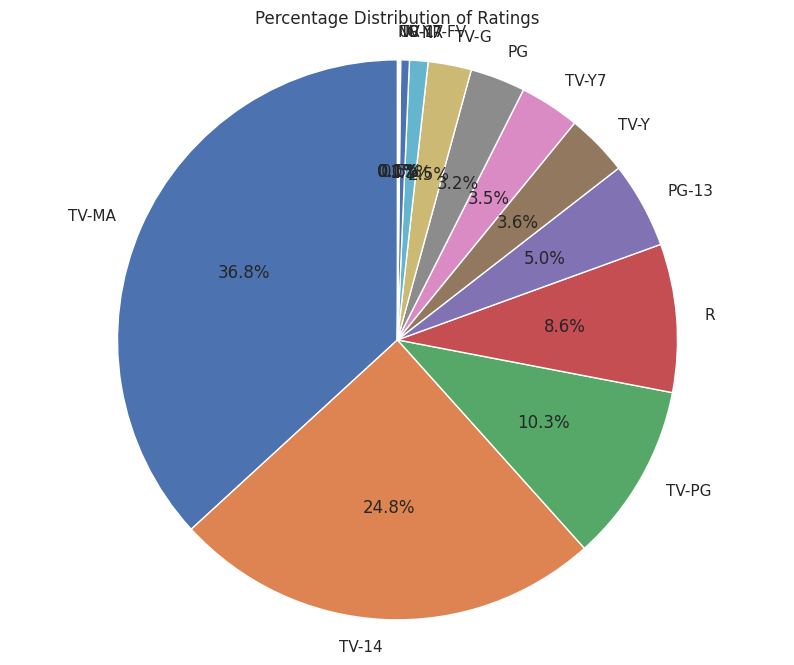

In [ ]:
# Chart - 2 visualization code

import matplotlib.pyplot as plt

ratings_count = data['rating'].value_counts()
labels = ratings_count.index
sizes = ratings_count.values

plt.figure(figsize=(10, 8))  # Set the figure size as desired
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
plt.axis('equal')
plt.title('Percentage Distribution of Ratings')
plt.show()


##### 1. Why did you pick the specific chart?

Pie chart is to visually represent the percentage distribution of ratings in the dataset. Pie charts are effective in showing the proportion of each category (different ratings) in relation to the whole.

##### 2. What is/are the insight(s) found from the chart?

* Rating Distribution
* Rating Composition
* Popular Rating Categories

These insights provide an overview of the rating distribution and can be useful in understanding the preferences and audience reception of Netflix movies and TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* High Ratings: If a significant portion of the ratings is positive (e.g., 4 or 5 stars), it indicates that customers are highly satisfied with the content. This can help Netflix identify successful movies and TV shows that attract a large audience and consider investing more in similar content or producing sequels.

* Target Audience: The rating distribution can provide insights into the preferences of different audience segments. If specific rating categories, such as 'PG-13' or 'TV-MA', have a higher percentage, it suggests that these genres or age-specific content are popular among certain viewer demographics. Netflix can leverage this information to curate personalized recommendations and develop targeted marketing strategies.

#### Chart - 3--Distribution of Ratings by Type

In [ ]:
rating_type_counts = data.groupby(['rating', 'type']).size()
print(rating_type_counts)


rating    type   
G         Movie        39
NC-17     Movie         3
NR        Movie        79
          TV Show       4
PG        Movie       247
PG-13     Movie       386
R         Movie       663
          TV Show       2
TV-14     Movie      1272
          TV Show     656
TV-G      Movie       111
          TV Show      83
TV-MA     Movie      1845
          TV Show    1016
TV-PG     Movie       505
          TV Show     299
TV-Y      Movie       117
          TV Show     162
TV-Y7     Movie        95
          TV Show     175
TV-Y7-FV  Movie         5
          TV Show       1
UR        Movie         5
dtype: int64


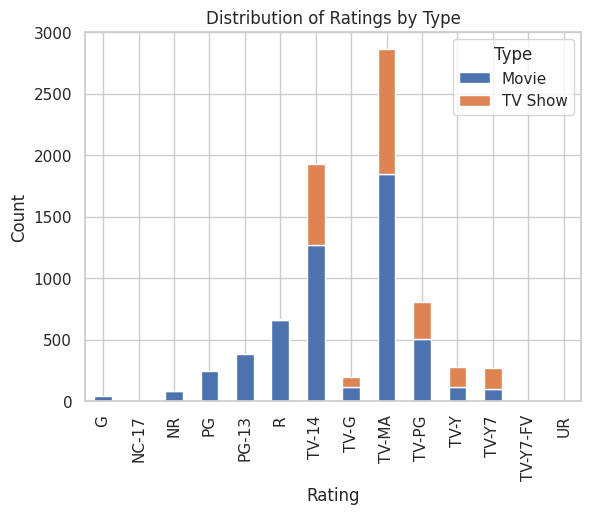

In [ ]:
# Chart - 3 visualization code

import matplotlib.pyplot as plt
import seaborn as sns

rating_counts = data.groupby(['rating', 'type']).size().unstack()
rating_counts.plot(kind='bar', stacked=True)

plt.xlabel('Rating')
plt.ylabel('Count')
plt.title('Distribution of Ratings by Type')
plt.legend(title='Type')
plt.show()


##### 1. Why did you pick the specific chart?

The stacked bar chart was selected to present the distribution of ratings by type because it effectively represents the relationship between the variables, allows for comparison between categories, and provides a clear and concise visual representation of the data.

##### 2. What is/are the insight(s) found from the chart?

The chart provides a comprehensive view of the distribution of ratings by type, allowing us to gain insights into how ratings are distributed and compare the patterns between movies and TV shows in the Netflix dataset.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* The distribution of ratings by type (movies or TV shows) can provide valuable insights into the preferences of Netflix viewers.
* This information can be used to optimize content acquisition strategies, tailor marketing campaigns, and make data-driven decisions on content production and investment.

#### Chart - 4-- trends in the number of Netflix releases over the years

In [ ]:
data.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

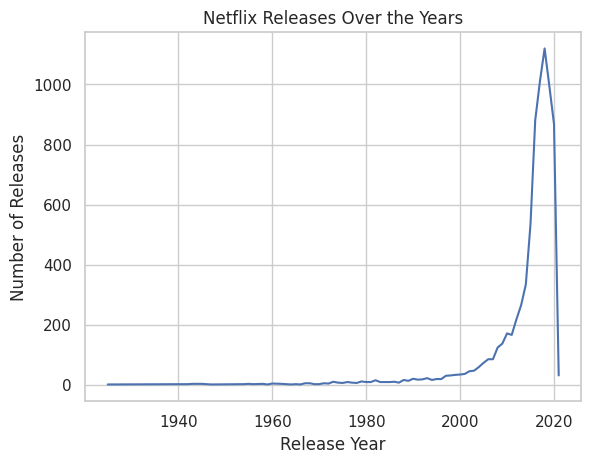

In [ ]:
# Chart - 4 visualization code

releases_by_year = data.groupby('release_year').size()

releases_by_year.plot(kind='line')

plt.xlabel('Release Year')
plt.ylabel('Number of Releases')
plt.title('Netflix Releases Over the Years')
plt.show()


##### 1. Why did you pick the specific chart?

The line chart was selected because it is well-suited for showcasing the temporal patterns and trends in the number of Netflix releases over the years, making it easy to interpret and analyze the data.

##### 2. What is/are the insight(s) found from the chart?

1. Increasing Trend: The chart shows the trend of the number of releases on Netflix increasing over the years.

2. Steep Rise: The chart may reveal certain years where there is a significant spike in the number of releases.

3. Growth Patterns: The chart can also provide insights into the growth patterns of specific genres or types of content.

4. Seasonal Variations: The chart may exhibit seasonal variations in the number of releases.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The gained insights from the dataset can potentially create a positive business impact for Netflix. Here are a few reasons:

* Understanding User Preferences.

* Improved Content Curation.

* Strategic Decision Making.

#### Chart - 5--Distribution of the duration of movies and TV shows based on their ratings

In [ ]:
# Chart - 5 visualization code

In [ ]:
# Remove non-numeric characters from the 'duration' column
data['duration'] = data['duration'].str.extract('(\d+)', expand=False)

# Convert the 'duration' column to numeric
data['duration'] = pd.to_numeric(data['duration'])

# Verify the updated 'duration' column data type
print(data['duration'].dtypes)


int64


In [ ]:
movies_df = data[data['type'] == 'Movie']
tv_shows_df = data[data['type'] == 'TV Show']


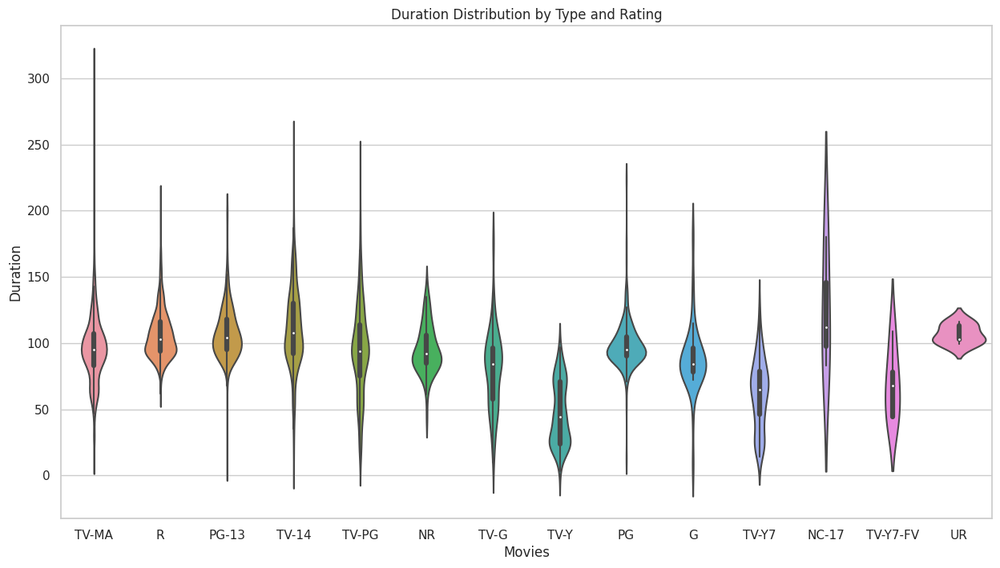

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the figure size
plt.figure(figsize=(15, 8))

sns.violinplot(x='rating', y='duration',data=movies_df)
plt.xlabel('Movies')
plt.ylabel('Duration')
plt.title('Duration Distribution by Type and Rating')
plt.show()



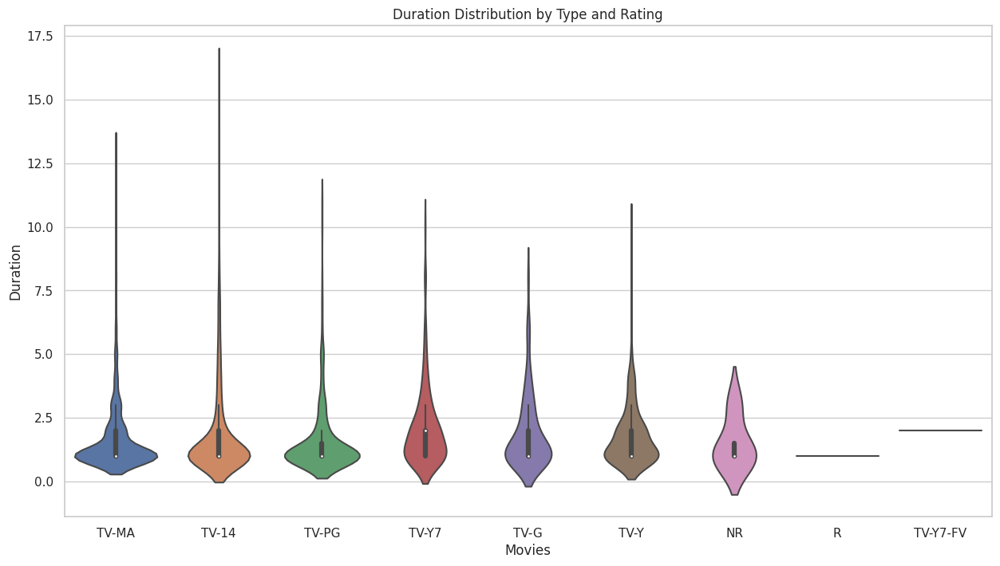

In [ ]:
# Set the figure size
plt.figure(figsize=(15, 8))

sns.violinplot(x='rating', y='duration',data=tv_shows_df)
plt.xlabel('Movies')
plt.ylabel('Duration')
plt.title('Duration Distribution by Type and Rating')
plt.show()


##### 1. Why did you pick the specific chart?

The violin plot is to visualize the distribution of the duration of movies and TV shows based on their ratings. It is a suitable choice because it displays the distribution of data, including the probability density, providing an overview of the distribution's shape and any potential outliers.

##### 2. What is/are the insight(s) found from the chart?

The charts provide a visual representation of the duration distribution for movies and TV shows, segmented by ratings. They help in identifying any patterns or differences in duration across different rating categories and contribute to a better understanding of the dataset.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights can contribute to better content curation, improved user experience, and potentially higher viewer engagement, leading to a positive impact on the business.

#### Chart - 6--Bar Plot - Top 10 Genre in movies

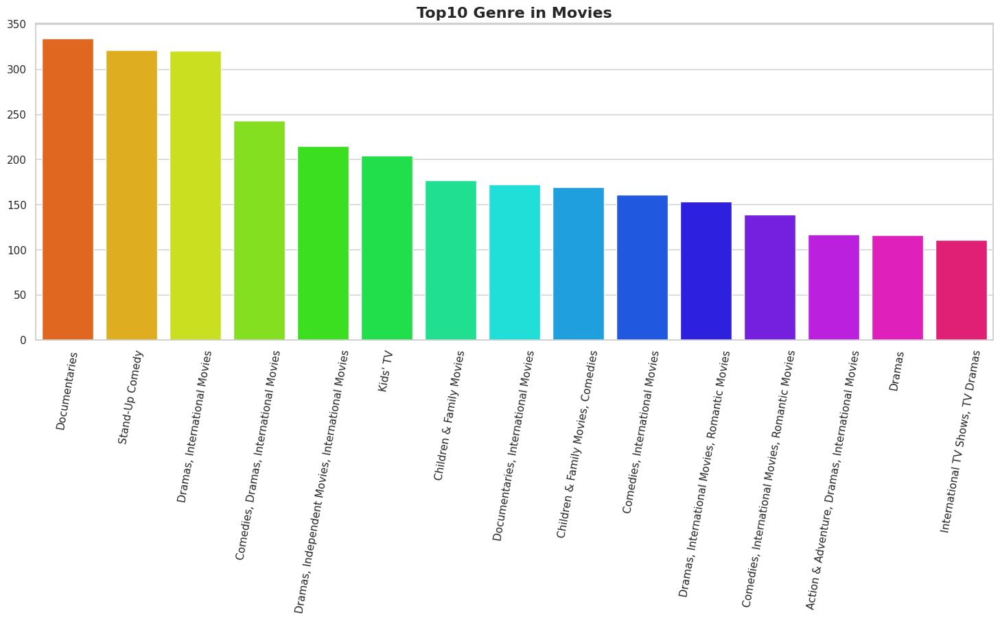

In [ ]:
# Chart - 6 visualization code

# Top 10 Genre in movies
plt.figure(figsize=(18,6))
sns.barplot(x = data["listed_in"].value_counts().head(15).index,
            y = data["listed_in"].value_counts().head(15).values,palette="hsv")
plt.xticks(rotation=80)
plt.title("Top10 Genre in Movies",size='16',fontweight="bold")
plt.show()

##### 1. Why did you pick the specific chart?

The bar plot effectively presents the top 10 genres in movies, allowing for easy comparison and providing valuable insights into the distribution of genres in the dataset.

##### 2. What is/are the insight(s) found from the chart?

Documentaries, Stand-up Comedy, Drama, International movies and comedies are some of the highly popular content on the platform. the reason being people use ott platforms as the source of entertainment and they often love the content that is more relatable to their life and feel real.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights could help Netflix make informed decisions about its content acquisition and production strategies. By understanding the popularity of different genres among its subscribers, Netflix can build a more diverse and appealing content library that meets the needs and preferences of its audience. This could help drive subscriber growth, increase engagement, and establish a competitive advantage in the streaming industry.

#### Chart - 7---Top 20 Movies/TV shows by Release Year

In [ ]:
# Chart - 7 visualization code

#creating two new df's
tv_shows=data[data['type']=='TV Show']
movies=data[data['type']=='Movie']

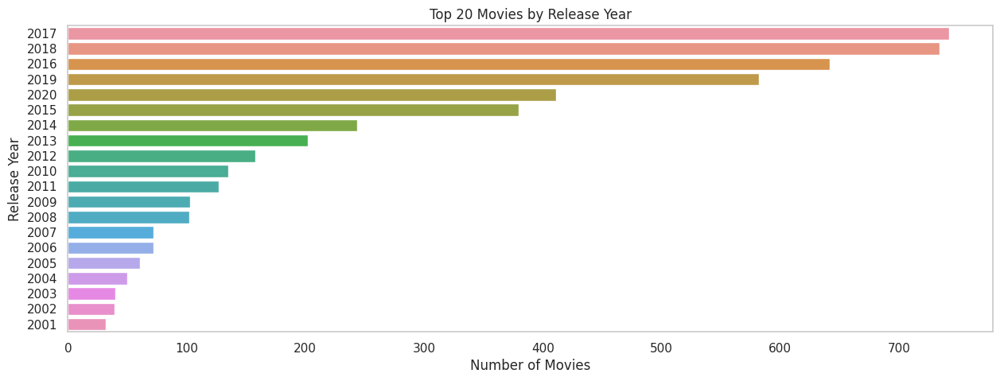

In [ ]:
plt.figure(figsize=(15,5))
sns.set_palette('bright')
sns.countplot(y=movies['release_year'],data=data,order=movies['release_year'].value_counts().index[0:20])
plt.title('Top 20 Movies by Release Year')
plt.xlabel('Number of Movies')
plt.ylabel('Release Year')
plt.grid(axis='x')

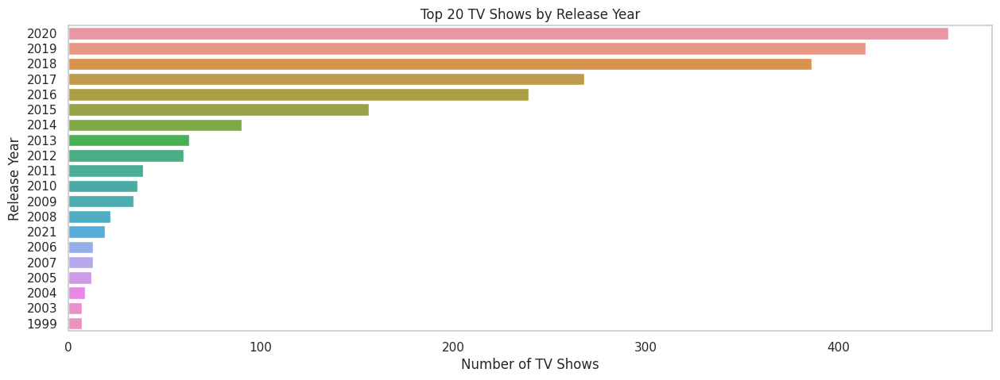

In [ ]:
plt.figure(figsize=(15,5))
sns.set_palette('bright')
sns.countplot(y=tv_shows['release_year'],data=data,order=tv_shows['release_year'].value_counts().index[0:20])
plt.title('Top 20 TV Shows by Release Year')
plt.xlabel('Number of TV Shows')
plt.ylabel('Release Year')
plt.grid(axis='x')

##### 1. Why did you pick the specific chart?

We used this chart to plot the count of TV shows and movies differently.

##### 2. What is/are the insight(s) found from the chart?

* Maximum number of movies released or added is in the year 2018.
* Maximum number of TV shows released is in the year 2020, as it was covid time period and everyone is at their home, so netflix use this opportunity to give offers and quality content to the audiences that led to more release in movies and TV shows.
* We saw a huge increase in the number of movies and television episodes after 2014.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 8--Check the count of TV shows and movies over month.

In [ ]:
# Chart - 8 visualization code

data['month'] = pd.DatetimeIndex(data['date_added']).month
data.head()


,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,8
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,12
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",12
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",11
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123,Dramas,A brilliant group of students become card-coun...,1


<Axes: xlabel='month', ylabel='count'>

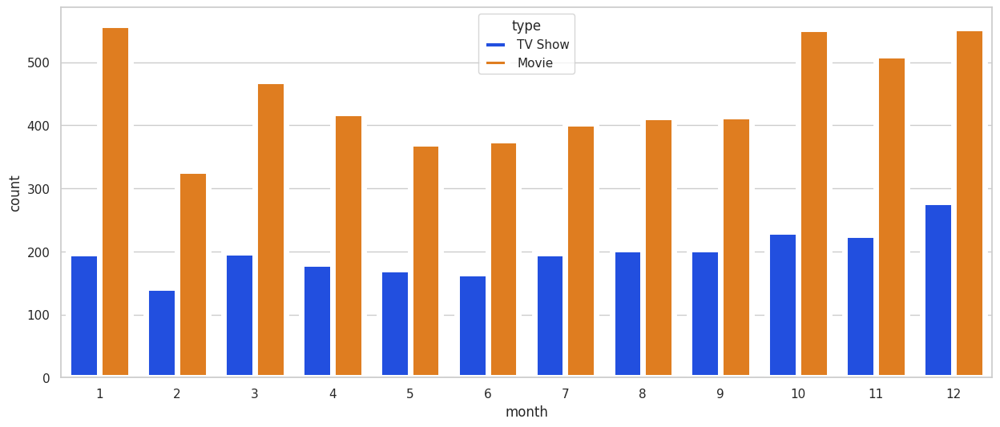

In [ ]:
fig, ax = plt.subplots(figsize=(15,6)) #plt.subplots() is a function that returns a tuple containing a figure and axes object(s).
                                       #Thus when using fig, ax = plt.subplots() you unpack this tuple into the variables fig and ax

sns.countplot(x='month', hue='type',lw=5, data=data, ax=ax)

##### 1. Why did you pick the specific chart?

Countplot is used to Show the counts of observations in each categorical bin using bars. We used this specific chart to check the count of TV shows and movies over month.

##### 2. What is/are the insight(s) found from the chart?

Maximum number of content is released in the month of December followed by january.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights can be used to promote more targeted marketing strategies in specific months when the release is high. It can help drive more subsriptions to the platform and eventually more revenue.

#### Chart - 9--Distribution of Movie/TV shows Durations

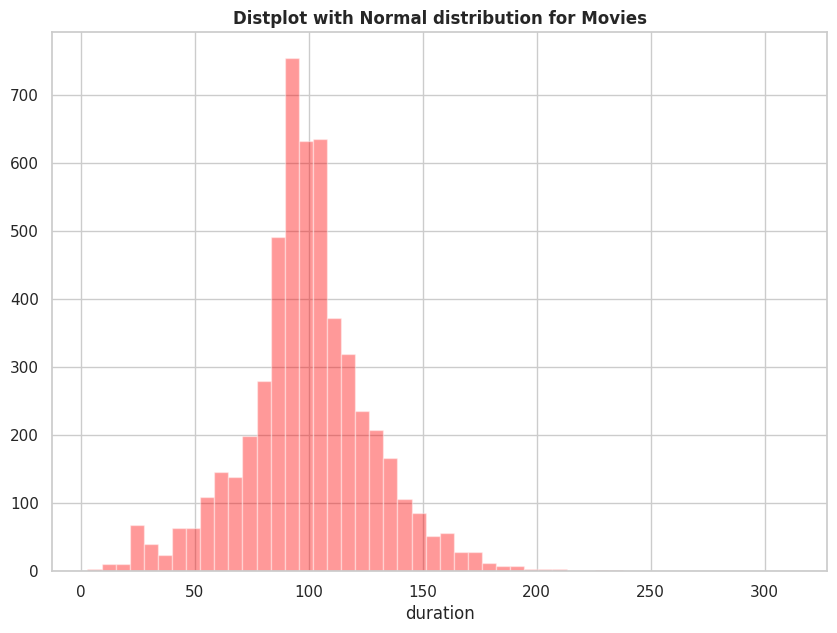

In [ ]:
# Chart - 9 visualization code

#Checking the distribution of Movie Durations
plt.figure(figsize=(10,7))
sns.distplot(movies['duration'],kde=False, color=['red'])
plt.title('Distplot with Normal distribution for Movies',fontweight="bold")
plt.show()

<Axes: title={'center': 'Distribution of TV Shows duration'}, xlabel='duration', ylabel='count'>

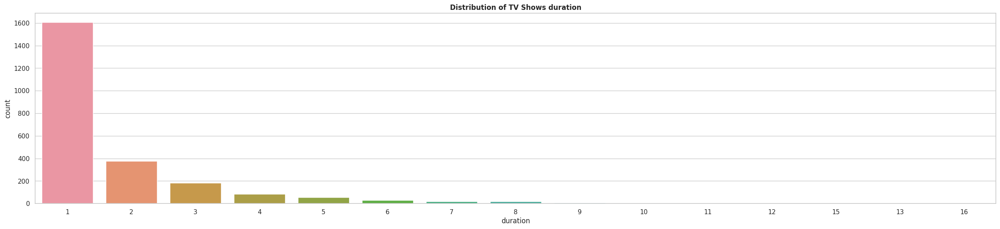

In [ ]:
#Checking the distribution of TV SHOWS
plt.figure(figsize=(30,6))
plt.title("Distribution of TV Shows duration",fontweight='bold')
sns.countplot(x=tv_shows['duration'],data=tv_shows,order = tv_shows['duration'].value_counts().index)

##### 1. Why did you pick the specific chart?

To check the distribution of duration feature for movies, and TV shows.

##### 2. What is/are the insight(s) found from the chart?

The variable named duration follow a distribution which is close to normal distribution, while there is highly skewed distribution for TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 10--Pie plot showing percentage of originals and others in movies

In [ ]:
# Chart - 10 visualization code
data['date_added'] = pd.to_datetime(data['date_added'])

data['year_added'] = data['date_added'].dt.year



In [ ]:
# All the movies and TV shows in different dataframe
movies = data[data['type']=='Movie']
tv_shows= data[data['type']=='TV Show']

([<matplotlib.patches.Wedge at 0x7b28242c77f0>,
 [Text(-0.8900699117813855, -0.6463555926434588, 'Others'),
  Text(0.9709853583069661, 0.7051151919746822, 'Originals')],
 [Text(-0.48549267915348293, -0.3525575959873411, '69.99%'),
  Text(0.5664081256790635, 0.4113171953185646, '30.01%')])

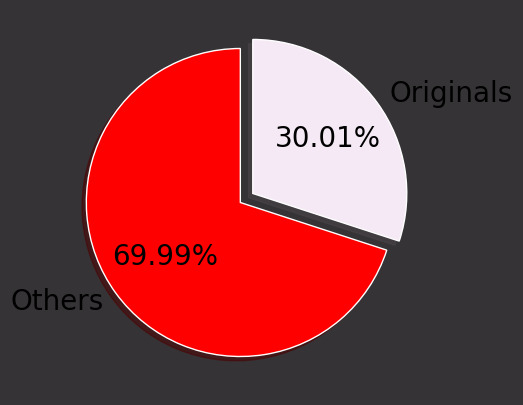

In [ ]:
movies['originals'] = np.where(movies['release_year']==movies['year_added'], 'Yes', 'No')
# pie plot showing percentage of originals and others in movies
fig, ax = plt.subplots(figsize=(5,5),facecolor="#363336")
ax.patch.set_facecolor('#363336')
explode = (0, 0.1)        #This will make the "Originals" slice of the pie chart stand out a bit from the "Others" slice.
ax.pie(movies['originals'].value_counts(), explode=explode, autopct='%.2f%%', labels= ['Others', 'Originals'],
       shadow=True, startangle=90,textprops={'color':"black", 'fontsize': 20}, colors =['red','#F5E9F5'])
     #The autopct parameter specifies that the percentage values should be displayed with 2 decimal places.

##### 1. Why did you pick the specific chart?

We used pie chart, with specifying several parameters to plot the difference between Netflix's original content and other content on the platform.

##### 2. What is/are the insight(s) found from the chart?

Netflix has over 30% original content which shows that netflix invests heavily in creating and promoting their own original content. This can be seen as part of Netflix's strategy to differentiate themselves from other streaming platforms and to maintain a competitive advantage.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* By better understanding the popularity of original content versus other content on the platform, Netflix may be able to more effectively allocate its marketing budget to promote the most popular content, which can improve the overall performance of the platform and help maintain its subscriber base.

* By promoting their original content, Netflix can also build their brand recognition and reputation as a provider of high-quality and innovative content.

* By understanding the popularity of original content on the platform can help Netflix make more informed decisions about content acquisition and retention, marketing, and brand management, which can ultimately lead to a positive business impact for the company.

#### Chart - 11--Check the distribution of TV shows and movies across years

In [ ]:
# Chart - 11 visualization code

df_release_year = data.groupby(['release_year','type'])['show_id'].count().reset_index()
df_release_year

,release_year,type,show_id
0,1925,TV Show,1
1,1942,Movie,2
2,1943,Movie,3
3,1944,Movie,3
4,1945,Movie,3
...,...,...,...
113,2019,TV Show,414
114,2020,Movie,411
115,2020,TV Show,457
116,2021,Movie,12


<Axes: xlabel='release_year', ylabel='show_id'>

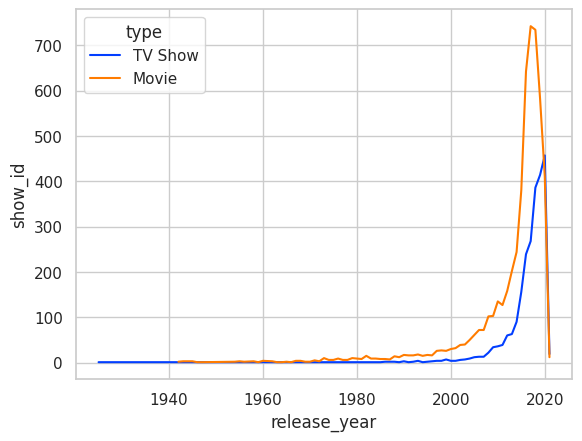

In [ ]:
# creating Visualisation
sns.lineplot(data = df_release_year, x= 'release_year', y = 'show_id', hue = 'type')

##### 1. Why did you pick the specific chart?

We used this plot to check the distribution of TV shows and movies across years. Line plots are a useful tool for analyzing trends and patterns over time, especially when dealing with data across different years.

##### 2. What is/are the insight(s) found from the chart?

* The insight that can be drawn is that the number of TV shows and movies on Netflix has increased significantly since 2010.
* The significant increase in the number of TV shows and movies on Netflix since 2010 could reflect the evolution of the streaming industry. As more consumers have shifted away from traditional cable and satellite TV, the demand for on-demand streaming services has increased. Netflix has responded to this trend by investing in its content library and expanding its offerings to attract more subscribers.
* Netflix is known for its data-driven decision-making approach, and the increase in the number of TV shows and movies on its platform could reflect the company's use of data to identify consumer preferences and trends.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* By understanding audience preferences and trends, Netflix can continue to build a content library that meets the needs and preferences of its subscribers. This could help improve the overall customer experience and increase customer satisfaction, which could in turn lead to higher retention rates and increased revenue.

* By building a robust and diverse content library, Netflix can establish a competitive advantage over its rivals in the streaming industry. This can help attract more subscribers and increase market share, which could contribute to the overall success of the business.

#### Chart - 12--word_cloud

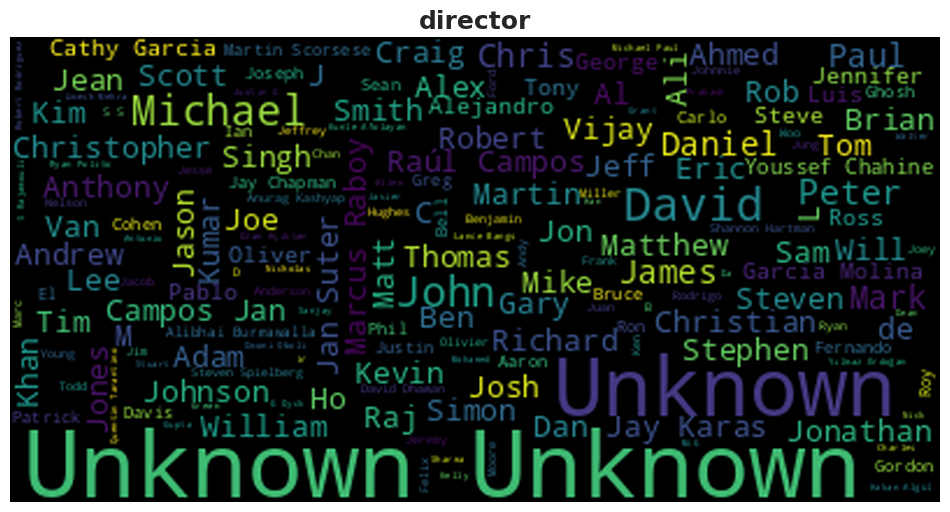

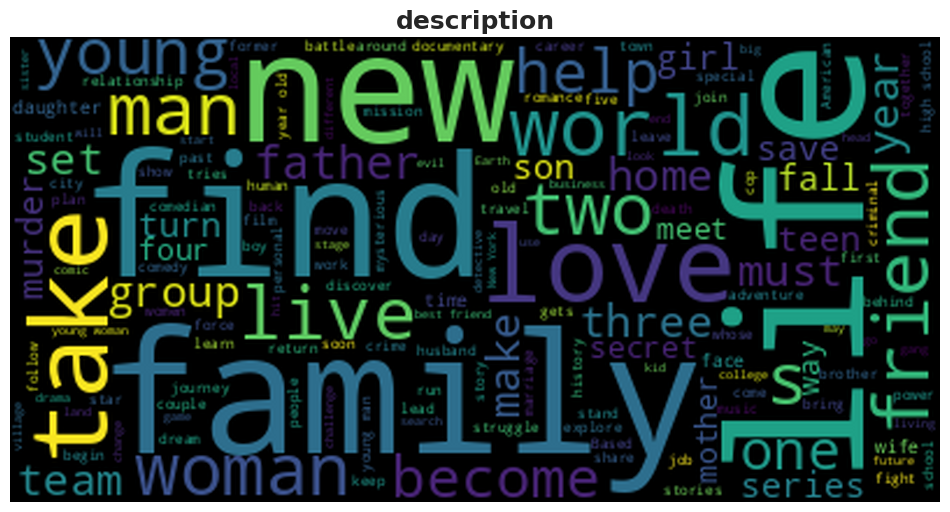

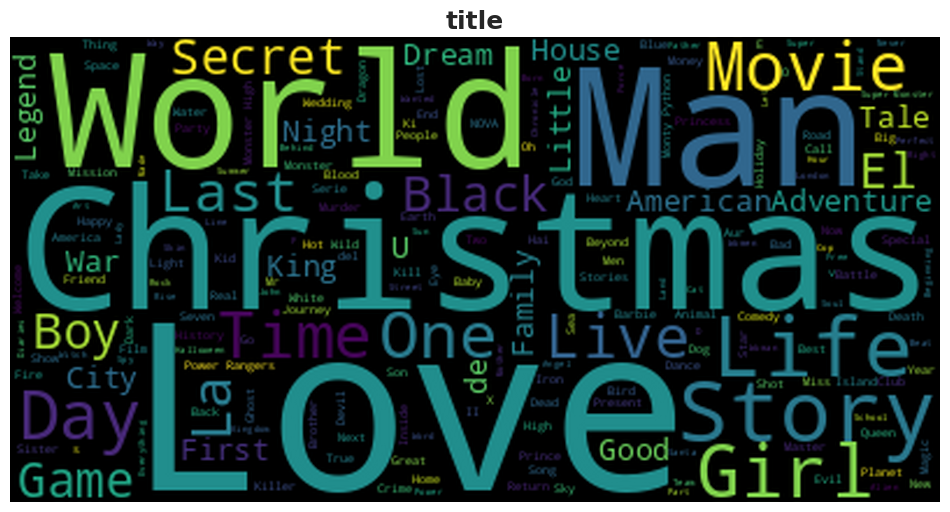

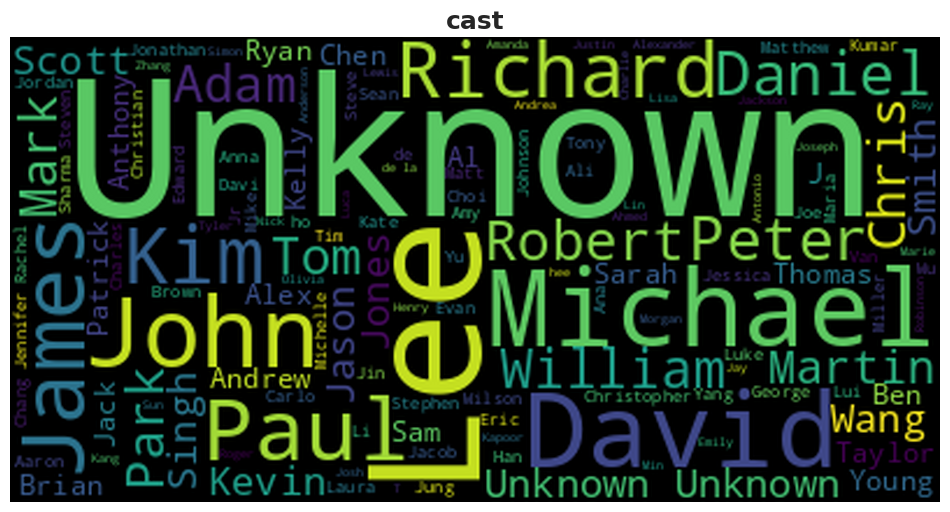

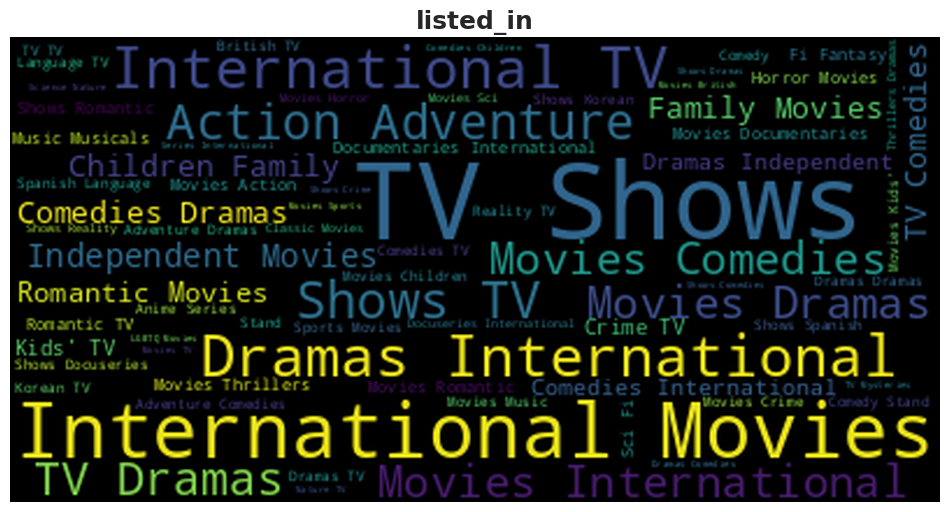

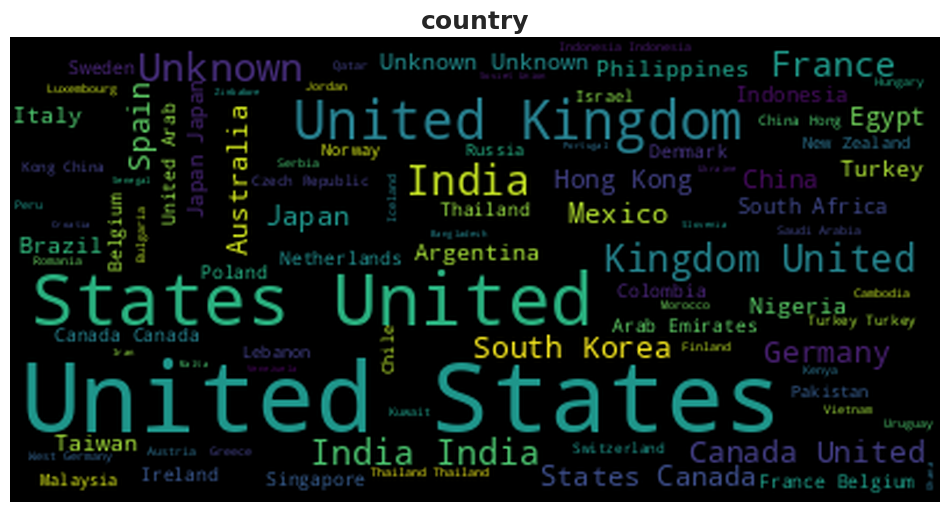

In [ ]:
# Chart - 10 visualization code
features_for_wordplot = ['director', 'description', 'title', 'cast', 'listed_in', 'country']
for i in features_for_wordplot:

  df_word_cloud = data[i]
  text = " ".join(word for word in df_word_cloud)
  # Create stopword list:
  stopwords = set(STOPWORDS)        #stopwords set is used to remove these common words from the text before generating the word cloud.
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
  # Display the generated image:
  # the matplotlib way:
  plt.figure(figsize=(12,10))
  plt.imshow(wordcloud, interpolation='blackman')
  plt.axis("off")
  plt.title(i, fontsize=18, fontweight='bold')
  plt.show()

In [ ]:
# Chart - 12 visualization code

df_duration = data.groupby(['duration'])['show_id'].count().sort_values(ascending= False).reset_index()
df_duration

,duration,show_id
0,1,1606
1,2,378
2,3,184
3,90,136
4,93,131
...,...,...
201,186,1
202,182,1
203,18,1
204,178,1


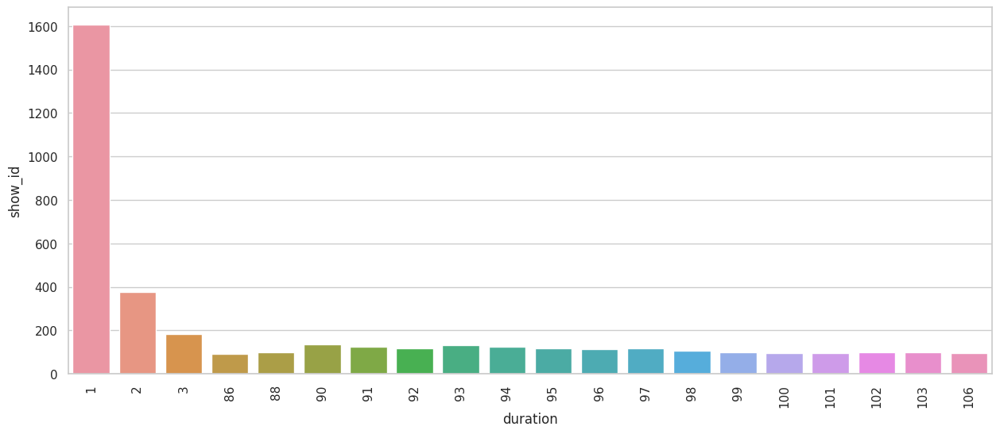

In [ ]:
plt.figure(figsize = (15, 6))
sns.barplot(data = df_duration, x = df_duration['duration'][:20], y = df_duration['show_id'])
plt.xticks(rotation = 90)
plt.show()

##### 1. Why did you pick the specific chart?

Bar plot here is used to plot the duration vs show-id count

##### 2. What is/are the insight(s) found from the chart?

* We can see that the maximum number of content in our data is related to Season 1, where the TV shows, movies or webseries made on the platform have atleast 1 season length.
* The fact that "Season 1" is the most frequent duration for TV shows on Netflix suggests that the streaming service typically organizes its original programming into seasons, rather than releasing episodes one-by-one or in smaller batches.
* The fact that "Season 1" is the most frequent duration for TV shows on Netflix could suggest that viewers are most likely to watch new shows when they are first released, rather than waiting for subsequent seasons to be released.
* This could be due to the marketing and promotion efforts that Netflix puts into new shows, or to the fact that viewers are more likely to be interested in a show when it is first released.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

These insights could be helpful in guiding Netflix's content acquisition and production strategies. By understanding the duration preferences of viewers, Netflix can make informed decisions about how to structure and release its original content, and how to allocate resources to produce content that resonates with its audience.

#### Chart - 13--  Compare the number of movies and TV shows produced by different countries

In [ ]:
# Chart - 13 visualization code

df_country = data.groupby(['country', 'type'])['show_id'].count().sort_values(ascending = False).reset_index()
df_country

,country,type,show_id
0,United States,Movie,1847
1,India,Movie,852
2,United States,TV Show,699
3,Unknown,TV Show,276
4,Unknown,Movie,229
...,...,...,...
770,"Iran, France",Movie,1
771,"Ireland, Canada",Movie,1
772,"Ireland, Canada, Luxembourg, United States, Un...",Movie,1
773,"Ireland, Canada, United Kingdom, United States",Movie,1


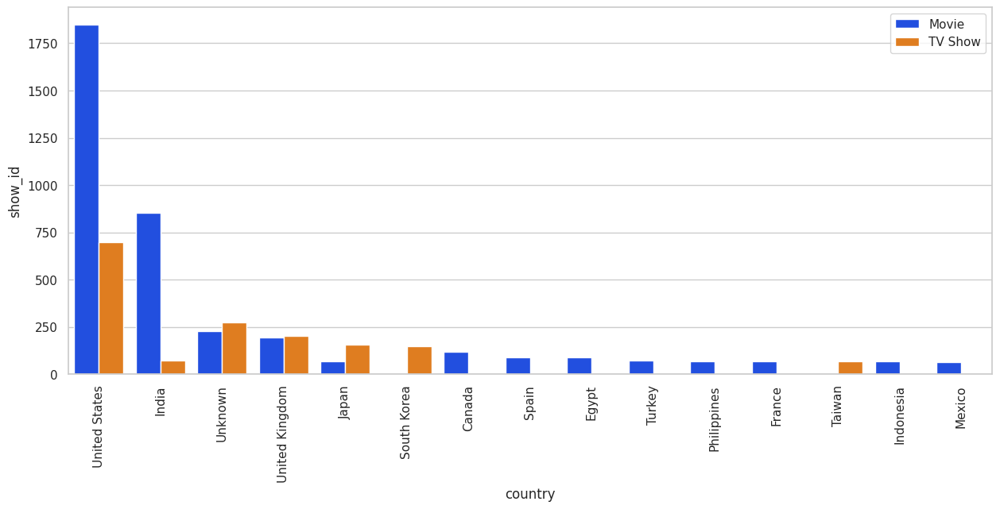

In [ ]:
plt.figure(figsize = (15, 6))
sns.barplot(data = df_country, x = df_country['country'][:20], y = df_country['show_id'], hue = 'type')
plt.xticks(rotation = 90)
plt.legend(loc = 'upper right')
plt.show()

##### 1. Why did you pick the specific chart?

Here we are doing Bivariate analysis using bar plot to compare the number of movies and TV shows produced by different countries. Bivariate analysis bar plots are used to compare the relationship between two categorical variables.

##### 2. What is/are the insight(s) found from the chart?

USA and India are topmost countries in producing content over the platform.

* As both the USA and India have very distinct cultural identities, the high production volume of movies and TV shows from these countries could indicate that their culture and values are widely consumed and popular among audiences worldwide.
* The fact that USA and India are the top producers of movies and TV shows could indicate that these markets are more attractive for investment in the industry.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The dominance of the USA and India in the movie and TV show production industry is an important insight for the industry as it can help inform business decisions related to production, distribution, and marketing.

#### Chart - 14 - Correlation Heatmap

In [ ]:
# Correlation Heatmap visualization code

#Assigning the Ratings into grouped categories
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
data['target_ages'] = data['rating'].replace(ratings)

In [ ]:
# Preparing data for heatmap
data['count'] = 1
df = data.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
df = df['country']

df_heatmap = data.loc[data['country'].isin(df)]
df_heatmap = pd.crosstab(df_heatmap['country'],df_heatmap['target_ages'],normalize = "index").T
df_heatmap

country,Canada,Egypt,France,India,Japan,South Korea,Spain,United Kingdom,United States,Unknown
target_ages,,,,,,,,,,
Adults,0.446328,0.277228,0.678261,0.255688,0.366071,0.469945,0.835821,0.512626,0.502357,0.318812
Kids,0.180791,0.000000,0.095652,0.016251,0.008929,0.027322,0.022388,0.093434,0.073449,0.170297
Older Kids,0.225989,0.039604,0.060870,0.160347,0.272321,0.120219,0.044776,0.204545,0.187353,0.235644
Teens,0.146893,0.683168,0.165217,0.567714,0.352679,0.382514,0.097015,0.189394,0.236842,0.275248


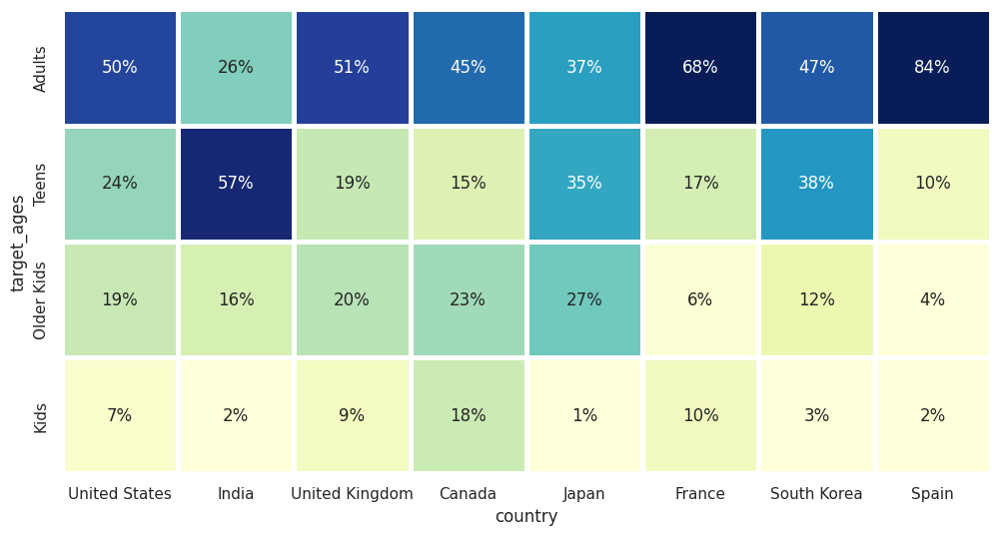

In [ ]:
# Plotting the heatmap
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

country_order2 = ['United States', 'India', 'United Kingdom', 'Canada', 'Japan', 'France', 'South Korea', 'Spain']

age_order = ['Adults', 'Teens', 'Older Kids', 'Kids']

sns.heatmap(df_heatmap.loc[age_order,country_order2],cmap="YlGnBu",square=True, linewidth=2.5,cbar=False,
            annot=True,fmt='1.0%',vmax=.6,vmin=0.05,ax=ax,annot_kws={"fontsize":12})

plt.show()

##### 1. Why did you pick the specific chart?

To visualize the distribution of the target_ages column across the top 10 countries with the most content on Netflix.

##### 2. What is/are the insight(s) found from the chart?

US and UK are closely aligned with their Netflix target ages, means that people in both USA and UK prefer to watch similar type of content.

In similar way US and Canada are also highly aligned with their Netflix target ages.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1 - Are the average durations of movies and TV shows significantly different?

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

* Null Hypothesis: The average duration of movies is equal to the average duration of TV shows

* Alternative Hypothesis: The average duration of movies is different from the average duration of TV shows

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

import scipy.stats as stats

# Subset the data for movies and TV shows
movies_duration = data[data['type'] == 'Movie']['duration']
tv_shows_duration = data[data['type'] == 'TV Show']['duration']

# Perform an independent t-test
t_stat, p_value = stats.ttest_ind(movies_duration, tv_shows_duration, equal_var=False)

# Print the results
print("Hypothesis Test: Average Durations of Movies and TV Shows")
print("Null Hypothesis: The average duration of movies is equal to the average duration of TV shows")
print("Alternative Hypothesis: The average duration of movies is different from the average duration of TV shows")
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")


Hypothesis Test: Average Durations of Movies and TV Shows
Null Hypothesis: The average duration of movies is equal to the average duration of TV shows
Alternative Hypothesis: The average duration of movies is different from the average duration of TV shows
T-statistic: 249.8698635138264
P-value: 0.0


##### Which statistical test have you done to obtain P-Value?

The statistical test performed to obtain the p-value is an independent t-test.

##### Why did you choose the specific statistical test?

The t-test is commonly used when comparing the means of two groups, and it assumes that the data follow a normal distribution. In this case, we assume that the durations of movies and TV shows are approximately normally distributed.

### Hypothetical Statement - 2-Is there a significant difference in the ratings between movies and TV shows?

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

* Null Hypothesis: There is no significant difference in the ratings between movies and TV shows
* Alternative Hypothesis: There is a significant difference in the ratings between movies and TV shows

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

import scipy.stats as stats

# Create a contingency table of ratings and types
contingency_table = pd.crosstab(data['rating'], data['type'])

# Perform a chi-square test
chi2_stat, p_value, _, _ = stats.chi2_contingency(contingency_table)

# Print the results
print("Hypothesis Test: Ratings Distribution in Movies and TV Shows")
print("Null Hypothesis: There is no significant difference in the ratings between movies and TV shows")
print("Alternative Hypothesis: There is a significant difference in the ratings between movies and TV shows")
print(f"Chi-square statistic: {chi2_stat}")
print(f"P-value: {p_value}")


Hypothesis Test: Ratings Distribution in Movies and TV Shows
Null Hypothesis: There is no significant difference in the ratings between movies and TV shows
Alternative Hypothesis: There is a significant difference in the ratings between movies and TV shows
Chi-square statistic: 930.2390474658954
P-value: 1.6546187394507098e-190


##### Which statistical test have you done to obtain P-Value?

The statistical test that was performed to obtain the p-value is the chi-square test of independence.

##### Why did you choose the specific statistical test?

The chi-square test for independence allows us to assess whether there is an association between the variables "rating" and "type." It examines whether the observed distribution of ratings is significantly different from what would be expected if there were no association between ratings and types

### Hypothetical Statement - 3- Is there a significant difference in the release years of movies and TV shows?

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

* Null Hypothesis: There is no significant difference in the release years of movies and TV shows
* Alternative Hypothesis: There is a significant difference in the release years of movies and TV shows

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

import scipy.stats as stats

# Subset the data for movies and TV shows
movies_release_years = data[data['type'] == 'Movie']['release_year']
tv_shows_release_years = data[data['type'] == 'TV Show']['release_year']

# Perform a Mann-Whitney U test
u_stat, p_value = stats.mannwhitneyu(movies_release_years, tv_shows_release_years, alternative='two-sided')

# Print the results
print("Hypothesis Test: Release Years of Movies and TV Shows")
print("Null Hypothesis: There is no significant difference in the release years of movies and TV shows")
print("Alternative Hypothesis: There is a significant difference in the release years of movies and TV shows")
print(f"Mann-Whitney U statistic: {u_stat}")
print(f"P-value: {p_value}")


Hypothesis Test: Release Years of Movies and TV Shows
Null Hypothesis: There is no significant difference in the release years of movies and TV shows
Alternative Hypothesis: There is a significant difference in the release years of movies and TV shows
Mann-Whitney U statistic: 4619200.5
P-value: 1.8772186034373436e-89


##### Which statistical test have you done to obtain P-Value?

The statistical test performed to obtain the p-value is the Mann-Whitney U test.

##### Why did you choose the specific statistical test?

The Mann-Whitney U test, was chosen because it is appropriate for comparing the distribution of a continuous variable (in this case, release years) between two independent groups when the data is not normally distributed. The Mann-Whitney U test is a non-parametric test that does not rely on assumptions about the underlying distribution of the data.

## **Feature Engineering & Data Pre-processing**

### 1. Handling Missing Values

In [ ]:
# Handling Missing Values & Missing Value Imputation

data.isnull().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
month           0
year_added      0
target_ages     0
count           0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?


All the null values in our dataset are handled till now.


### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Expand Contraction

In [ ]:
#Assigning the Ratings into grouped categories
ratings = {
    'TV-PG': 'Older Kids',
    'TV-MA': 'Adults',
    'TV-Y7-FV': 'Older Kids',
    'TV-Y7': 'Older Kids',
    'TV-14': 'Teens',
    'R': 'Adults',
    'TV-Y': 'Kids',
    'NR': 'Adults',
    'PG-13': 'Teens',
    'TV-G': 'Kids',
    'PG': 'Older Kids',
    'G': 'Kids',
    'UR': 'Adults',
    'NC-17': 'Adults'
}
data['target_ages'] = data['rating'].replace(ratings)

In [ ]:
# Expand Contraction

#merging all text column to single text column to work with

data['organized'] =  data['description'] + ' ' + data['listed_in'] + ' ' + data['target_ages'] + ' ' + data['country']+ ' ' + data['cast'] + ' '+ data['director']

In [ ]:
#filled all the missing value with empty strings
data['organized'] = data['organized'].fillna("")

In [ ]:
data['organized'][2]

"When an army recruit is found dead, his fellow soldiers are forced to confront a terrifying secret that's haunting their jungle island training camp. Horror Movies, International Movies Adults Singapore Tedd Chan, Stella Chung, Henley Hii, Lawrence Koh, Tommy Kuan, Josh Lai, Mark Lee, Susan Leong, Benjamin Lim Gilbert Chan"

In [ ]:
#text cleaning
import re
def cleaned(x):
    return re.sub(r"[^a-zA-Z ]","",str(x))   #to remove all non-alphabetic characters
data['organized'] = data['organized'].apply(cleaned)

#### 2. Lower Casing

In [ ]:
# Lower Casing
data['organized']= data['organized'].str.lower()

#### 3. Removing Punctuations

In [ ]:
# Remove Punctuations

import string

def remove_punctuation(text):
    # Create a translation table to remove punctuation using the string module
    translator = str.maketrans('', '', string.punctuation)
    # Apply the translation table to remove punctuation from the text
    text = text.translate(translator)
    return text

In [ ]:
data['organized'].apply(remove_punctuation)

0       in a future where the elite inhabit an island ...
1       after a devastating earthquake hits mexico cit...
2       when an army recruit is found dead his fellow ...
3       in a postapocalyptic world ragdoll robots hide...
4       a brilliant group of students become cardcount...
                              ...                        
7782    when lebanons civil war deprives zozo of his f...
7783    a scrappy but poor boy worms his way into a ty...
7784    in this documentary south african rapper nasty...
7785    dessert wizard adriano zumbo looks for the nex...
7786    this documentary delves into the mystique behi...
Name: organized, Length: 7770, dtype: object

#### 4. Removing URLs & Removing words and digits contain digits.

#### 5. Removing Stopwords & Removing White spaces

In [ ]:
#necessary import for nlp
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Removing Stopwords
def remove_stopwords(text):
    # Tokenizing the text into words
    words = nltk.word_tokenize(text)
    # Removing stopwords from the list of words
    words = [word for word in words if word.lower() not in stopwords.words('english')]
    # Joining the remaining words back into a single string
    text = ' '.join(words)
    return text

In [ ]:
data['organized'].apply(remove_stopwords)

0       future elite inhabit island paradise far crowd...
1       devastating earthquake hits mexico city trappe...
2       army recruit found dead fellow soldiers forced...
3       postapocalyptic world ragdoll robots hide fear...
4       brilliant group students become cardcounting e...
                              ...                        
7782    lebanons civil war deprives zozo family hes le...
7783    scrappy poor boy worms way tycoons dysfunction...
7784    documentary south african rapper nasty c hits ...
7785    dessert wizard adriano zumbo looks next willy ...
7786    documentary delves mystique behind bluesrock t...
Name: organized, Length: 7770, dtype: object

#### 8. Text Normalization

In [ ]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)

#stemming
stemmer = SnowballStemmer('english')
stop_words = set(stopwords.words('english'))

In [ ]:
def stem_text(text):
    words = nltk.word_tokenize(text)  # tokenizing the text into words
    stemmed_words = [stemmer.stem(word) for word in words]  # applying the Snowball stemmer to each word
    return ' '.join(stemmed_words)  # joining the stemmed words back into a single string

# Apply the stem_text function to a column of a pandas DataFrame, such as a column called 'text'
data['org_new'] = data['organized'].apply(stem_text)

In [ ]:
data.org_new

0       in a futur where the elit inhabit an island pa...
1       after a devast earthquak hit mexico citi trap ...
2       when an armi recruit is found dead his fellow ...
3       in a postapocalypt world ragdol robot hide in ...
4       a brilliant group of student becom cardcount e...
                              ...                        
7782    when lebanon civil war depriv zozo of his fami...
7783    a scrappi but poor boy worm his way into a tyc...
7784    in this documentari south african rapper nasti...
7785    dessert wizard adriano zumbo look for the next...
7786    this documentari delv into the mystiqu behind ...
Name: org_new, Length: 7770, dtype: object

In [ ]:
data.org_new.iloc[0]

'in a futur where the elit inhabit an island paradis far from the crowd slum you get one chanc to join the save from squalor intern tv show tv drama tv scifi fantasi adult brazil joo miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zez motta celso frateschi unknown'

##### Which text normalization technique have you used and why?

Here We used Snowball stemmer because it is a popular choice for stemming in NLP because it supports multiple languages, is accurate and efficient, and can be customized to meet specific needs.

#### 10. Text Vectorization

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month,year_added,target_ages,count,organized,org_new
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,8,2020,Adults,1,in a future where the elite inhabit an island ...,in a futur where the elit inhabit an island pa...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,12,2016,Adults,1,after a devastating earthquake hits mexico cit...,after a devast earthquak hit mexico citi trap ...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",12,2018,Adults,1,when an army recruit is found dead his fellow ...,when an armi recruit is found dead his fellow ...
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",11,2017,Teens,1,in a postapocalyptic world ragdoll robots hide...,in a postapocalypt world ragdol robot hide in ...
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123,Dramas,A brilliant group of students become card-coun...,1,2020,Teens,1,a brilliant group of students become cardcount...,a brilliant group of student becom cardcount e...


In [ ]:
# Vectorizing Text

new_df = data[['title', 'org_new']]

In [ ]:
new_df.head()

,title,org_new
0,3%,in a futur where the elit inhabit an island pa...
1,7:19,after a devast earthquak hit mexico citi trap ...
2,23:59,when an armi recruit is found dead his fellow ...
3,9,in a postapocalypt world ragdol robot hide in ...
4,21,a brilliant group of student becom cardcount e...


In [ ]:
#using tfidf
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
t_vectorizer = TfidfVectorizer(max_features=20000)
X= t_vectorizer.fit_transform(new_df['org_new'])

In [ ]:
X.shape

(7770, 20000)

##### Which text vectorization technique have you used and why?

Here we have used Tf-idf vectorization beacause it takes into account the importance of each word in a document. TF-IDF also assigns higher values to rare words that are unique to a particular document, making them more important in the representation.

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Answer Here.

In [ ]:
# DImensionality Reduction (If needed)
from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X.toarray())

PCA()

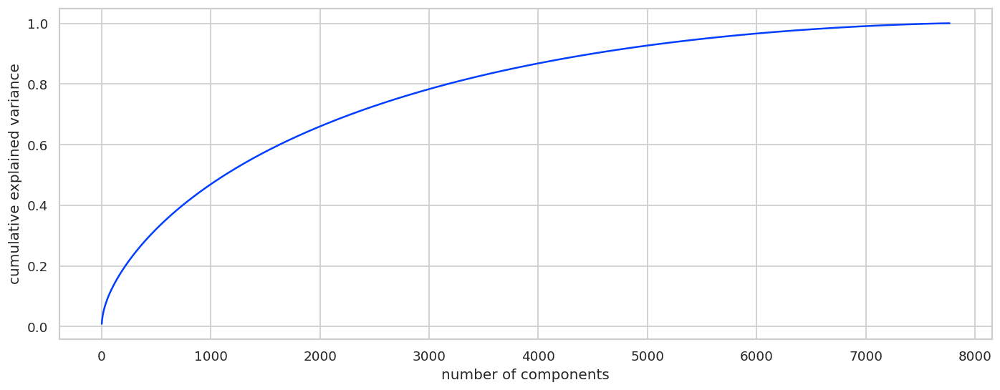

In [ ]:
# Lets plot explained var v/s comp to check how many components to be considered.
plt.figure(figsize=(14,5), dpi=120)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

* We can see from the above plot almost 95% of the variance can be explained by 5000 components.
* Since choosing 5000 could be tricky we will set the value to be 95% in sklearn.

In [ ]:
pca_tuned = PCA(n_components=0.95)
pca_tuned.fit(X.toarray())
X_transformed = pca_tuned.transform(X.toarray())
X_transformed.shape

(7770, 5539)

In [ ]:
X_transformed

array([[ 1.18382752e-01, -2.73139089e-02, -2.75297437e-03, ...,
        -1.14389799e-02,  3.68721520e-03, -3.80709887e-03],
       [-5.01745077e-02, -4.56330586e-02,  1.64829801e-02, ...,
         2.25910621e-03, -3.76910782e-03, -8.55771586e-03],
       [-6.40402987e-02, -7.59929188e-02, -1.84730606e-02, ...,
        -3.39696397e-04,  6.73597708e-03,  2.53708274e-04],
       ...,
       [-1.07719981e-02,  1.91492910e-01,  2.22509703e-01, ...,
        -6.23201021e-03, -5.10358858e-03,  1.27210513e-04],
       [ 1.13053803e-01,  2.32509841e-02, -2.02467487e-03, ...,
         2.68726769e-04, -2.05346773e-04, -4.24182653e-03],
       [-2.37068643e-02,  3.35811305e-01,  1.88225736e-01, ...,
         5.43415821e-03,  3.86295913e-03,  1.36364143e-03]])

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

Above we have used Principal component analysis which is one of the dimensionality reduction technique. We have used it in order to capture the maximum variance of our data into small number of features.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Answer Here.

In [ ]:
# Handling Imbalanced Dataset (If needed)

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***7. ML Model Implementation***

### ML Model - 1 K-Means Clustering

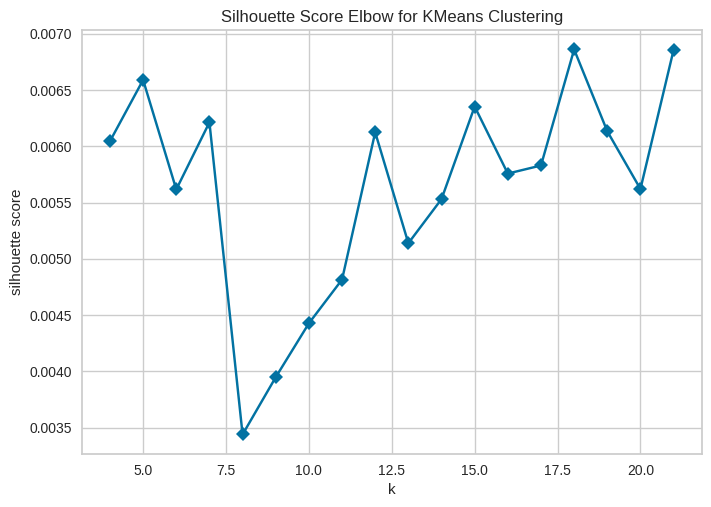

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [ ]:
# Visualizing evaluation Metric Score chart
from sklearn.cluster import KMeans

from yellowbrick.cluster import KElbowVisualizer

model = KMeans(random_state=5)
visualizer = KElbowVisualizer(model, k=(4,22), metric='silhouette', timings=False, locate_elbow=False)

visualizer.fit(X_transformed)
visualizer.show()

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer

In [ ]:
from sklearn.metrics import silhouette_score, silhouette_samples

def silhouette_score_analysis(n):

  for n_clusters in range(2,n):
      km = KMeans (n_clusters=n_clusters, random_state=5)
      preds = km.fit_predict(X_transformed)
      centers = km.cluster_centers_

      score = silhouette_score(X_transformed, preds, metric='euclidean')
      print ("For n_clusters = {}, silhouette score is {}".format(n_clusters, score))

      visualizer = SilhouetteVisualizer(km)

      visualizer.fit(X_transformed) # Fit the training data to the visualizer
      visualizer.poof() # Draw/show/poof the data

For n_clusters = 2, silhouette score is 0.0050567331734522065


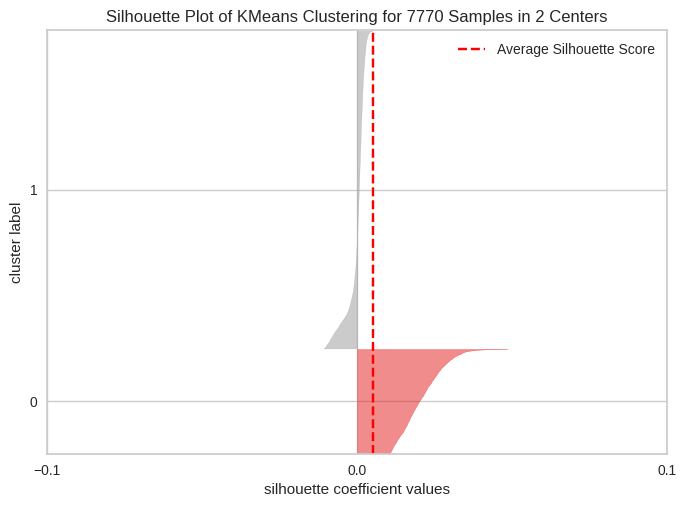

For n_clusters = 3, silhouette score is 0.004193866384494112


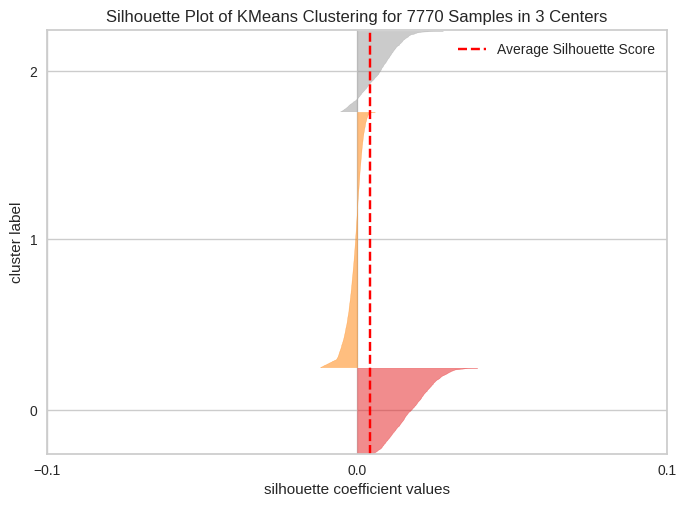

For n_clusters = 4, silhouette score is 0.006044596951994375


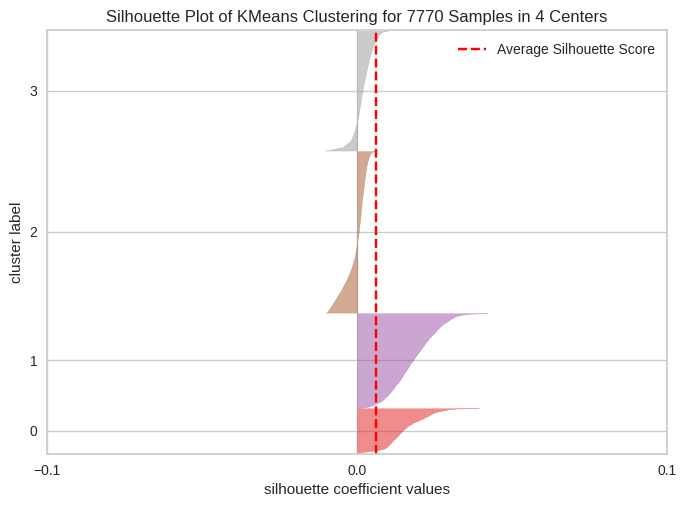

For n_clusters = 5, silhouette score is 0.006589343403571505


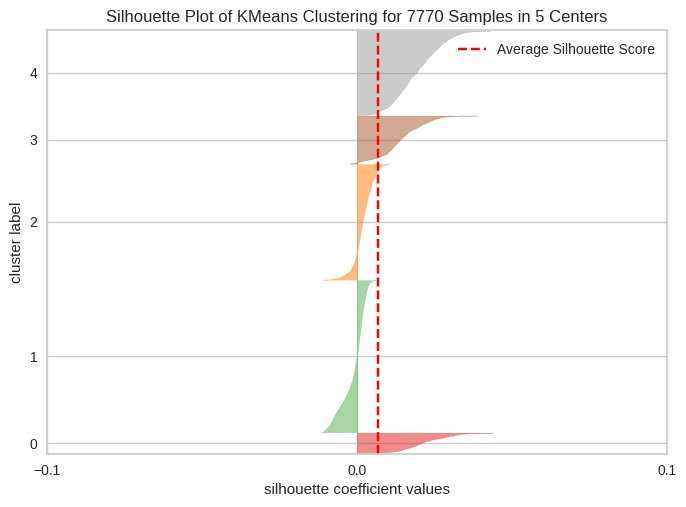

For n_clusters = 6, silhouette score is 0.00561604465093446


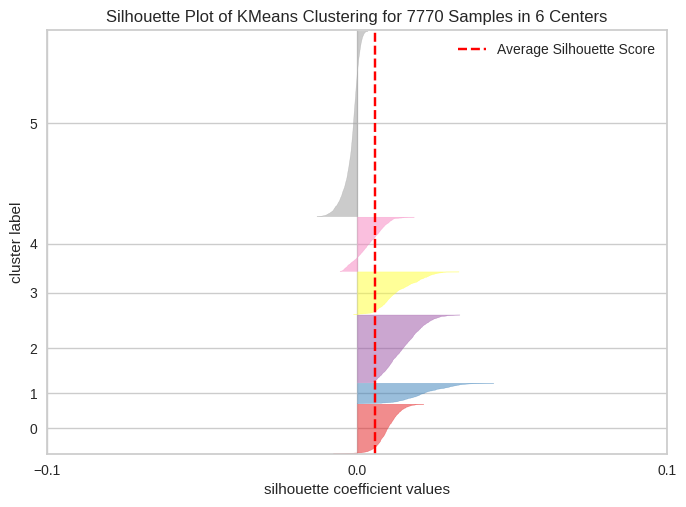

For n_clusters = 7, silhouette score is 0.00621239322024847


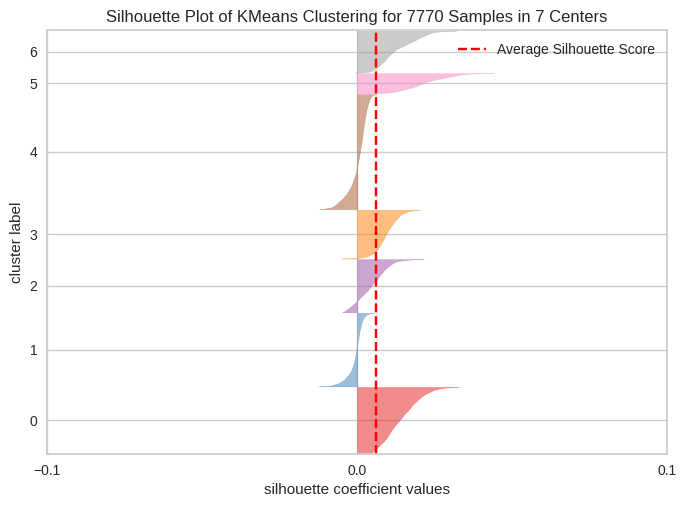

For n_clusters = 8, silhouette score is 0.003438878203301716


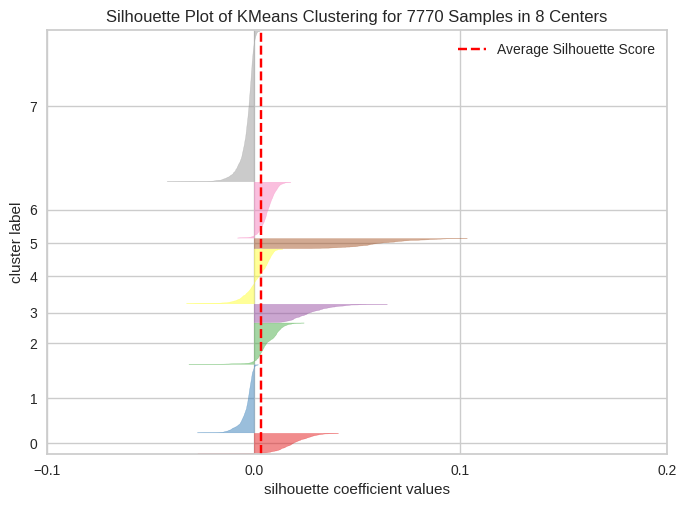

For n_clusters = 9, silhouette score is 0.00394781941018117


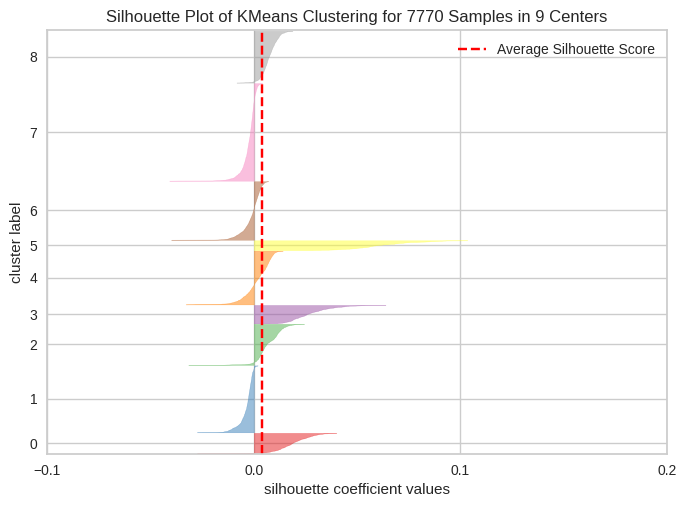

For n_clusters = 10, silhouette score is 0.004426686800992002


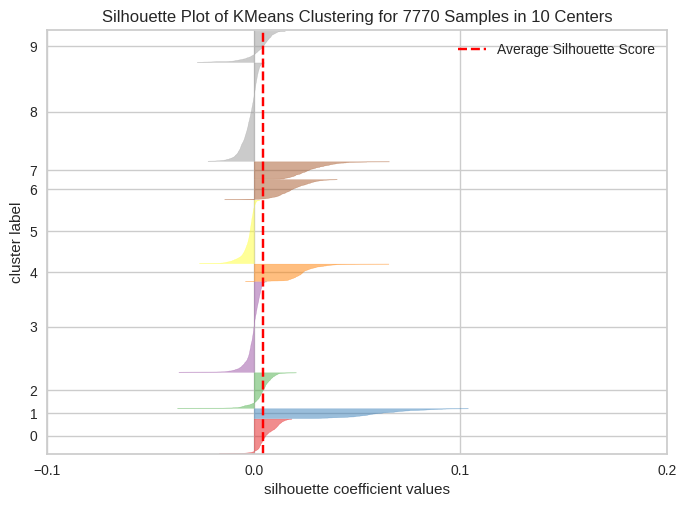

For n_clusters = 11, silhouette score is 0.004815014245168419


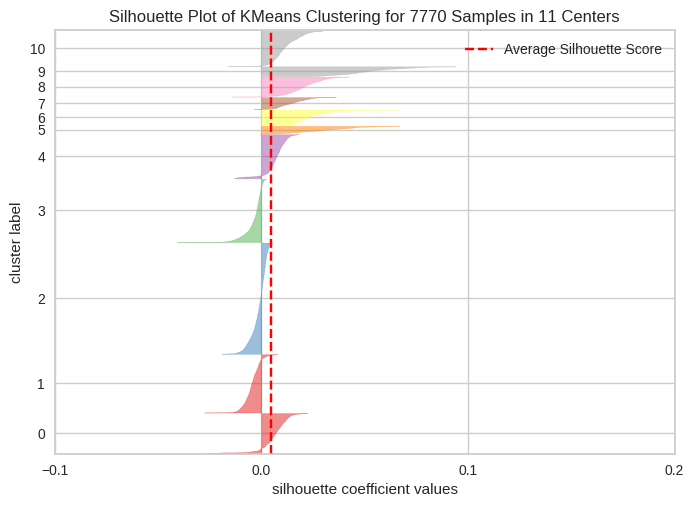

For n_clusters = 12, silhouette score is 0.006123984702491132


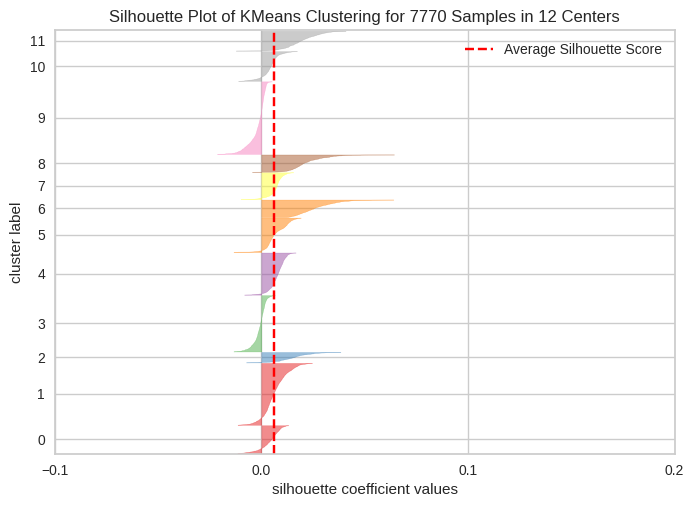

For n_clusters = 13, silhouette score is 0.00513827545911525


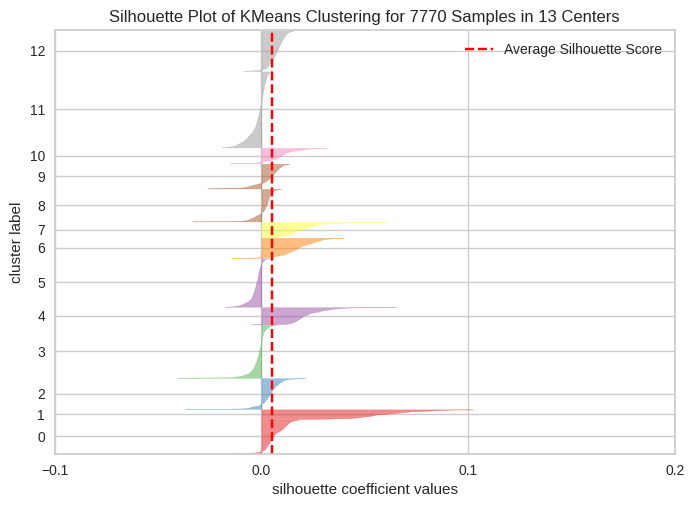

For n_clusters = 14, silhouette score is 0.0055303194750755385


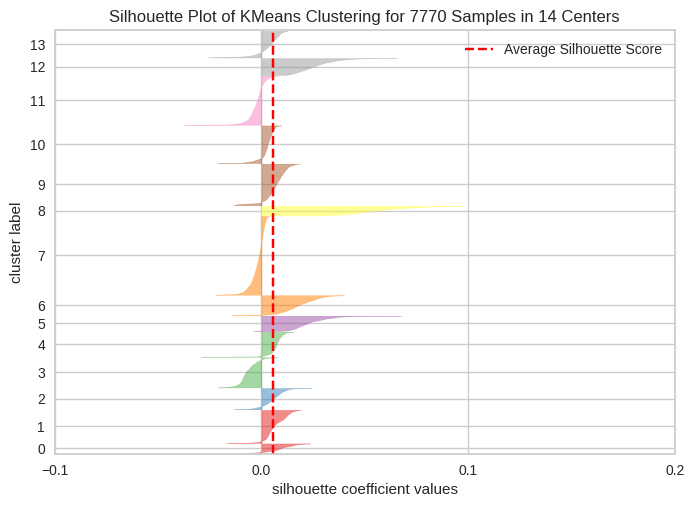

For n_clusters = 15, silhouette score is 0.006352703778082292


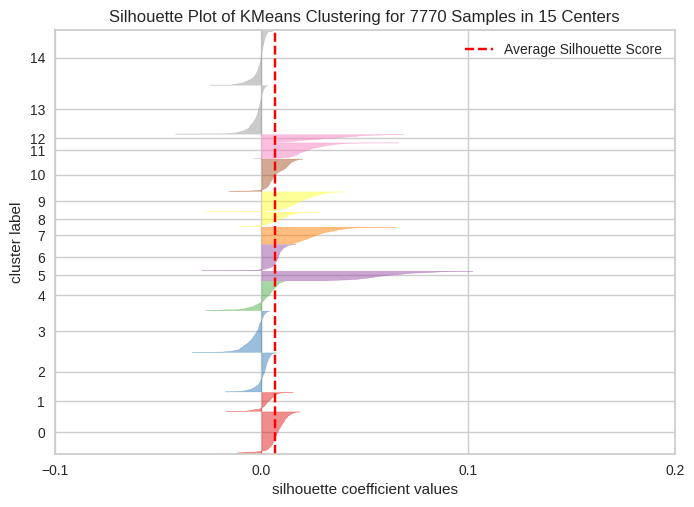

For n_clusters = 16, silhouette score is 0.0057572319165762696


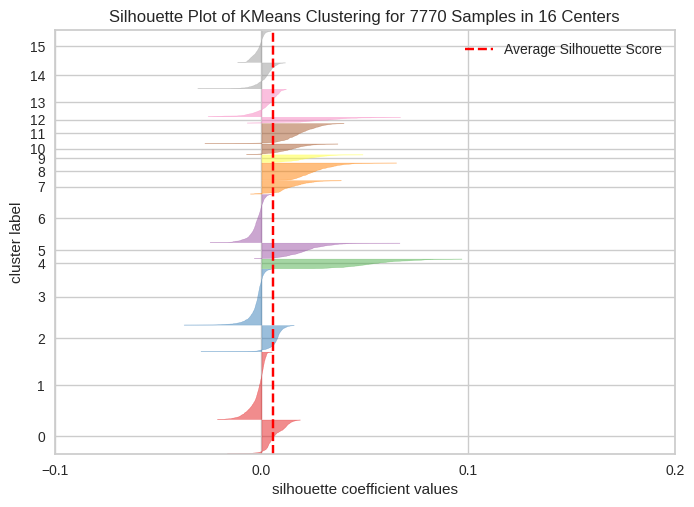

For n_clusters = 17, silhouette score is 0.005829005312311083


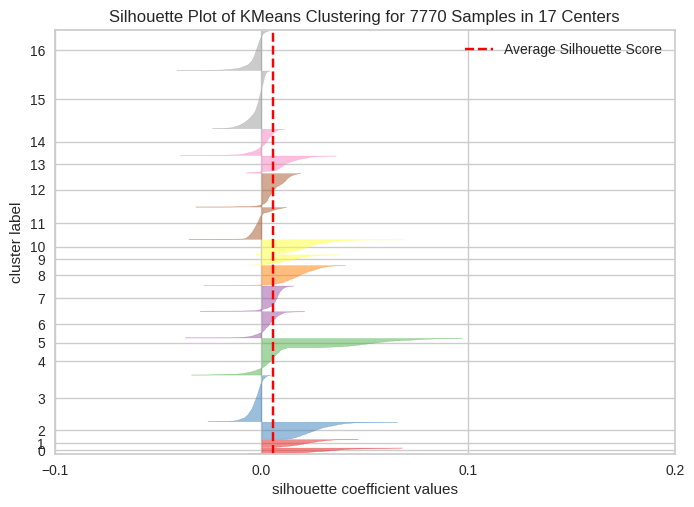

For n_clusters = 18, silhouette score is 0.006859905345979798


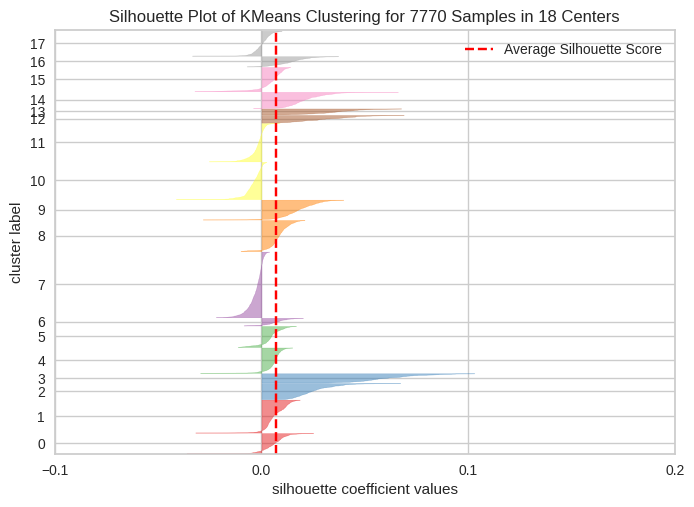

For n_clusters = 19, silhouette score is 0.006133124977179333


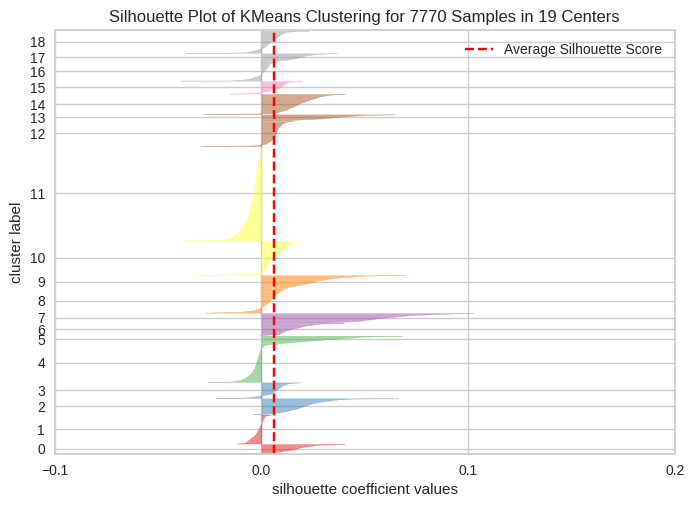

For n_clusters = 20, silhouette score is 0.005619938522403244


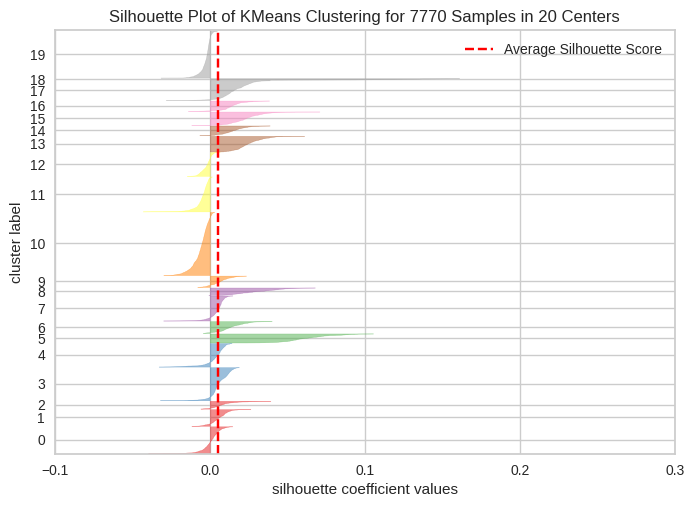

For n_clusters = 21, silhouette score is 0.0068558749873549076


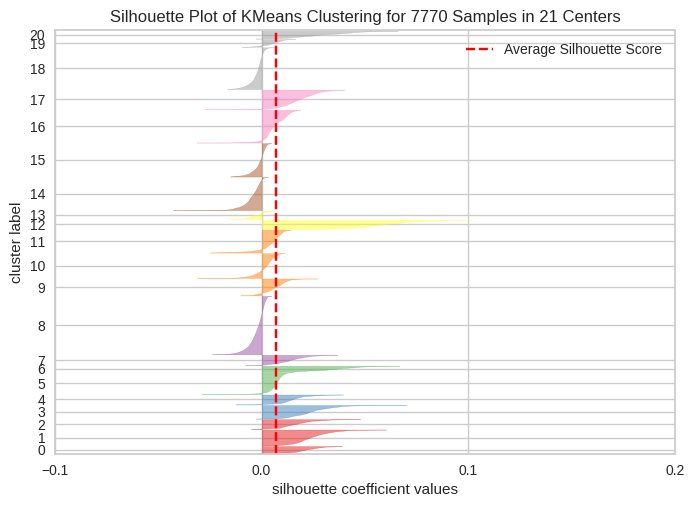

In [ ]:
silhouette_score_analysis(22)

Silhouette score is a metric used to evaluate the quality of clustering results. It measures how similar an object is to its own cluster (cohesion) compared to other clusters (separation). A silhouette score ranges from -1 to 1, with higher scores indicating better clustering.

Text(0, 0.5, 'WCSS')

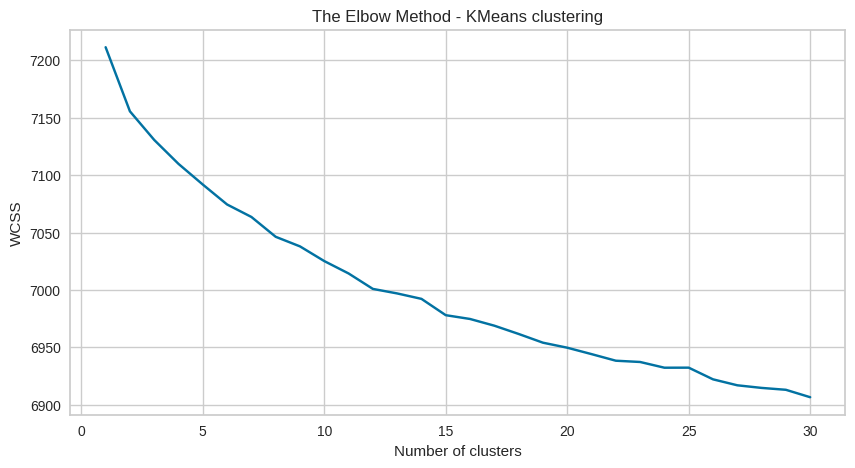

In [ ]:
# ML Model - 1 Implementation
# Elbow method to find the optimal value of k

wcss=[]
for i in range(1,31):
  kmeans = KMeans(n_clusters=i,init='k-means++',random_state=33)
  kmeans.fit(X_transformed)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_clusters = range(1,31)
plt.figure(figsize=(10,5))
plt.plot(number_clusters,wcss)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

The elbow method is a common technique used to determine the optimal number of clusters in a dataset. The method involves plotting the within-cluster sum of squares (WSS) for different numbers of clusters and identifying the "elbow" point on the plot, which represents the point of diminishing returns in terms of increasing the number of clusters. Here the number of cluster corresponding to the lower wss score is selected.

Here we will select the number of clusters as 10, as no drastic difference is visible after that.

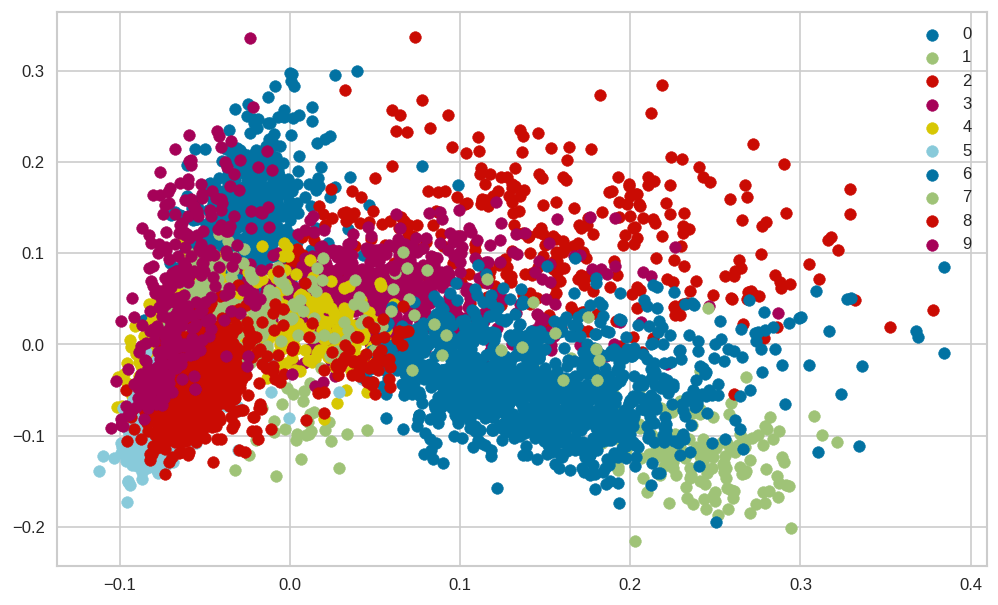

In [ ]:
plt.figure(figsize=(10,6), dpi=120)

kmeans= KMeans(n_clusters=10, init= 'k-means++', random_state=9)
kmeans.fit(X_transformed)

#predict the labels of clusters.
label = kmeans.fit_predict(X_transformed)
#Getting unique labels
unique_labels = np.unique(label)

#plotting the results:
for i in unique_labels:
    plt.scatter(X_transformed[label == i , 0] , X_transformed[label == i , 1] , label = i)
plt.legend()
plt.show()

In [ ]:
# Add cluster values to the dateframe.
data['cluster_number'] = kmeans.labels_

We have created a new column called "cluster_number," which indicates which observations are assigned to which cluster.

In [ ]:
data.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month,year_added,target_ages,count,organized,org_new,cluster_number
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020-08-14,2020,TV-MA,4,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,8,2020,Adults,1,in a future where the elite inhabit an island ...,in a futur where the elit inhabit an island pa...,6
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016-12-23,2016,TV-MA,93,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,12,2016,Adults,1,after a devastating earthquake hits mexico cit...,after a devast earthquak hit mexico citi trap ...,8
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2018-12-20,2011,R,78,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",12,2018,Adults,1,when an army recruit is found dead his fellow ...,when an armi recruit is found dead his fellow ...,8
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2017-11-16,2009,PG-13,80,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",11,2017,Teens,1,in a postapocalyptic world ragdoll robots hide...,in a postapocalypt world ragdol robot hide in ...,4
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2020-01-01,2008,PG-13,123,Dramas,A brilliant group of students become card-coun...,1,2020,Teens,1,a brilliant group of students become cardcount...,a brilliant group of student becom cardcount e...,4


In [ ]:
#word cloud for user rating review
def func_select_Category(cluster_label,column_of_choice):
  df_word_cloud = data[['cluster_number',column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud['cluster_number']==cluster_label]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
  # Plot the wordclouds
  plt.imshow(wordcloud, interpolation='blackman')
  plt.title(f'Cluster: {i}', fontsize=18, fontweight='bold')
  plt.axis("off")
  plt.show()

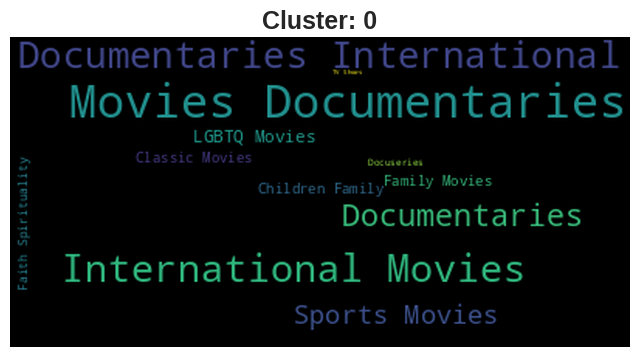

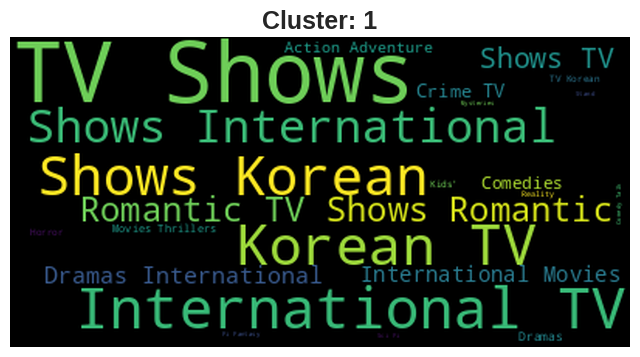

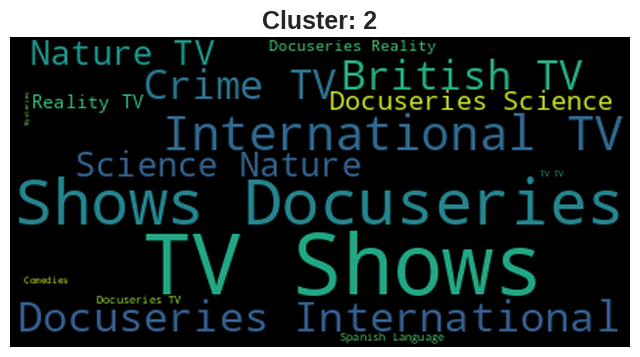

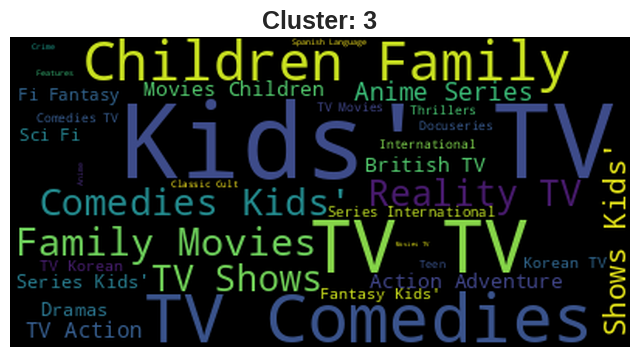

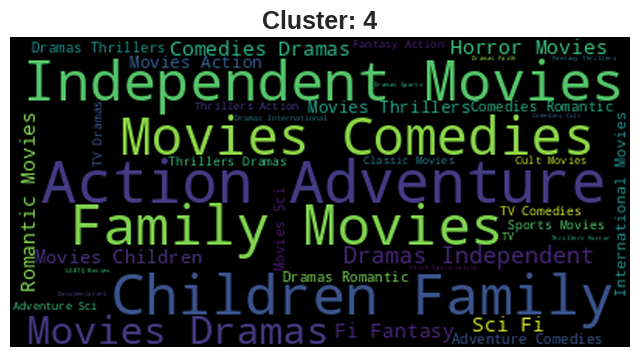

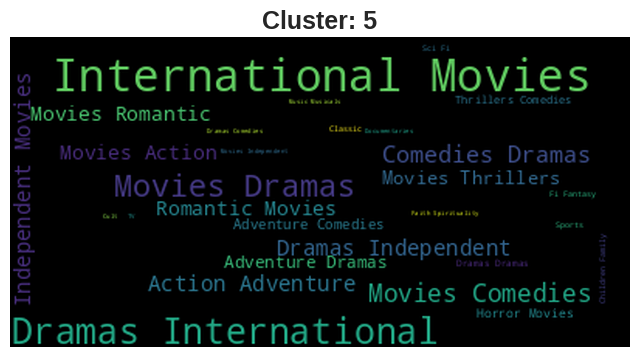

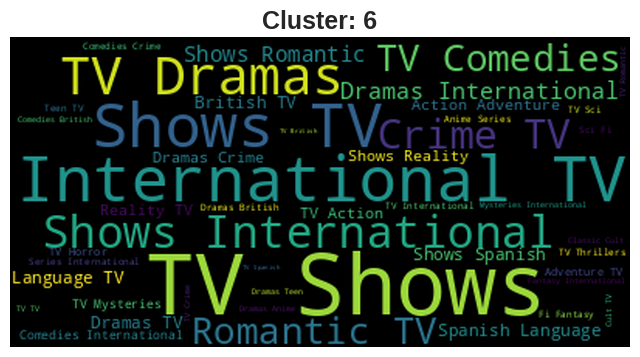

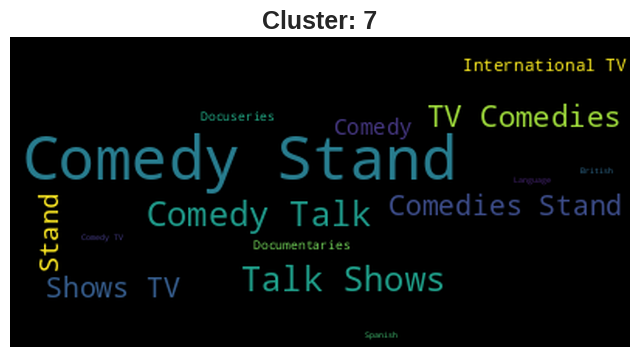

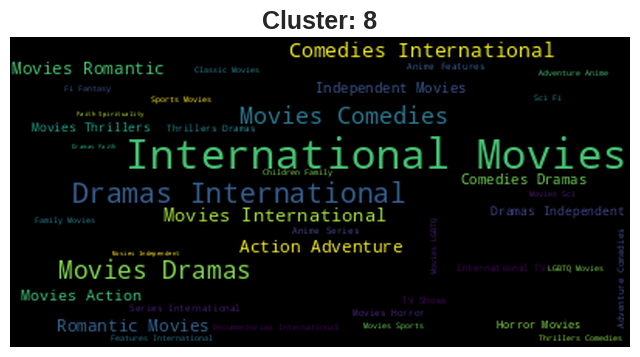

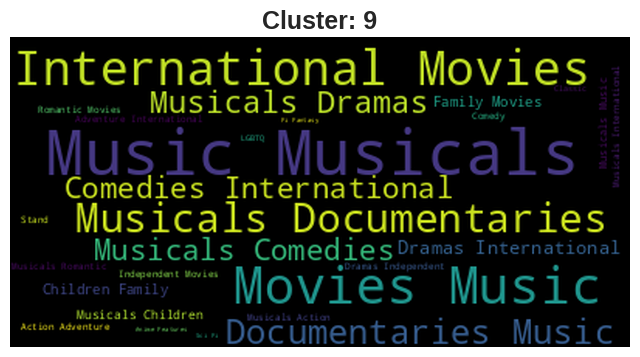

In [ ]:
for i in range(10):
  func_select_Category(i,'listed_in')

* Above we have built word cloud for our variable named 'listed_in' in different clusters, and we can see that there are different types of genres dominating in different clusters. For eg-: cluster 0 is about comedy and drama, cluster 4 is about tv shows, cluster 1 is about science and international movies, cluster 5 is about adventure, fantasy and action.

* This Clustering can help in content recommendation: Clustering can be used to recommend content to viewers based on their preferences. For example, if a viewer prefers science and international movies, the recommendation system can suggest movies from cluster 1.

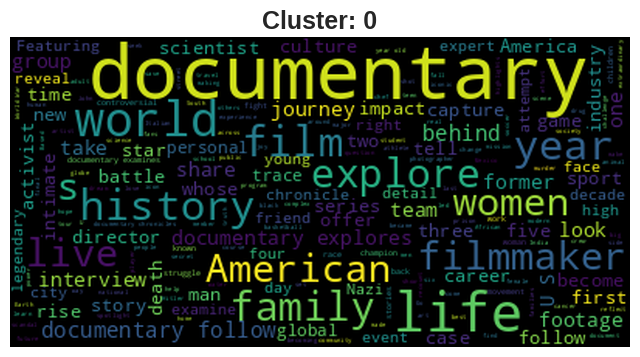

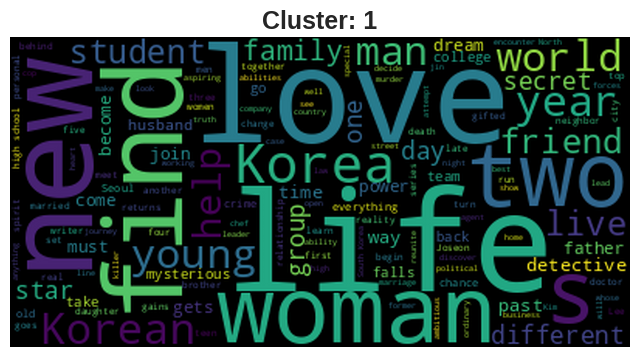

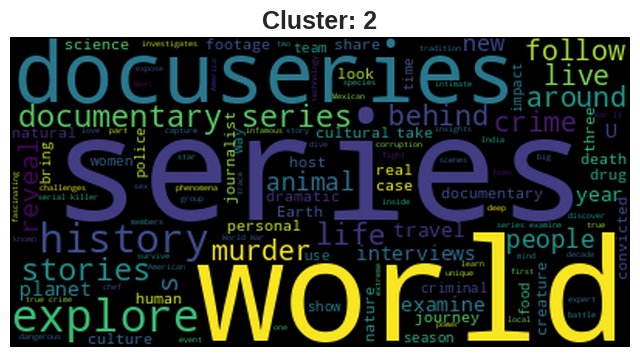

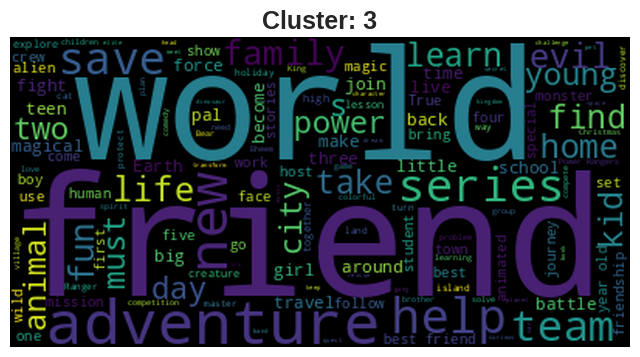

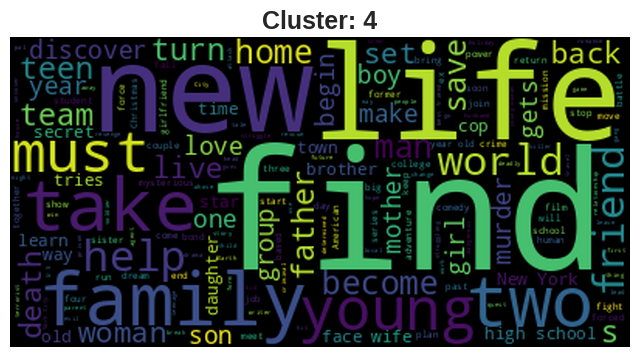

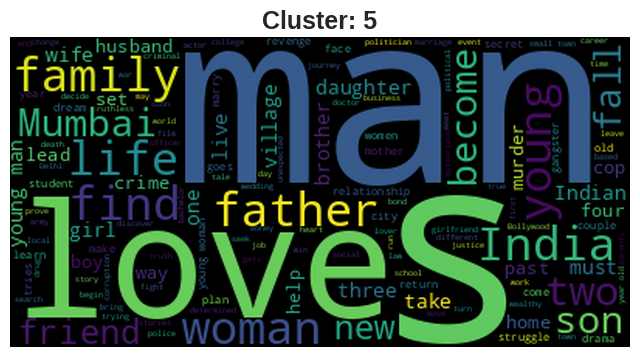

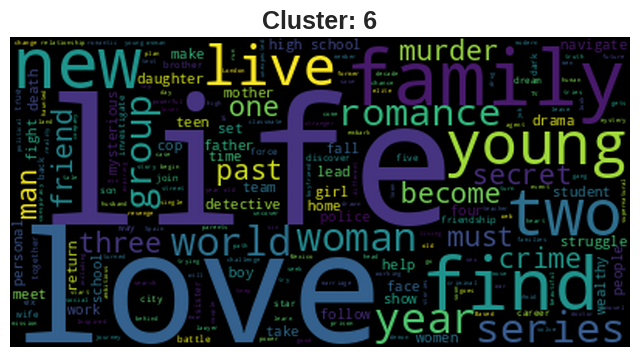

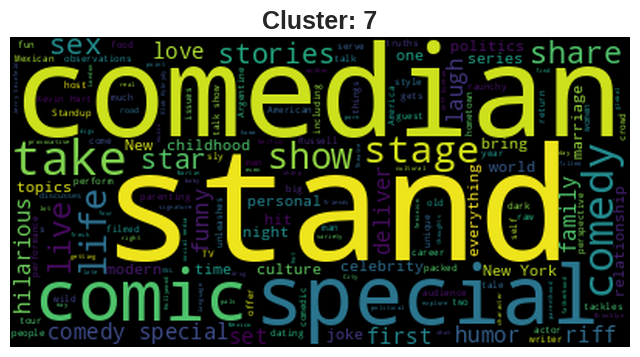

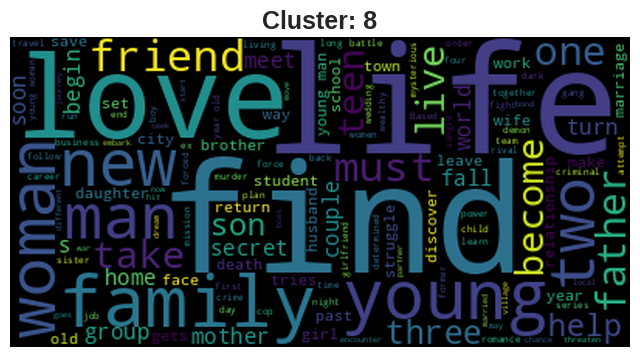

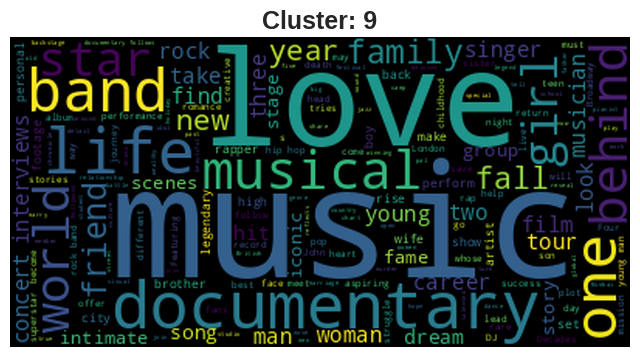

In [ ]:
for i in range(10):
  func_select_Category(i,'description')

### ML Model - 2   Dendogram

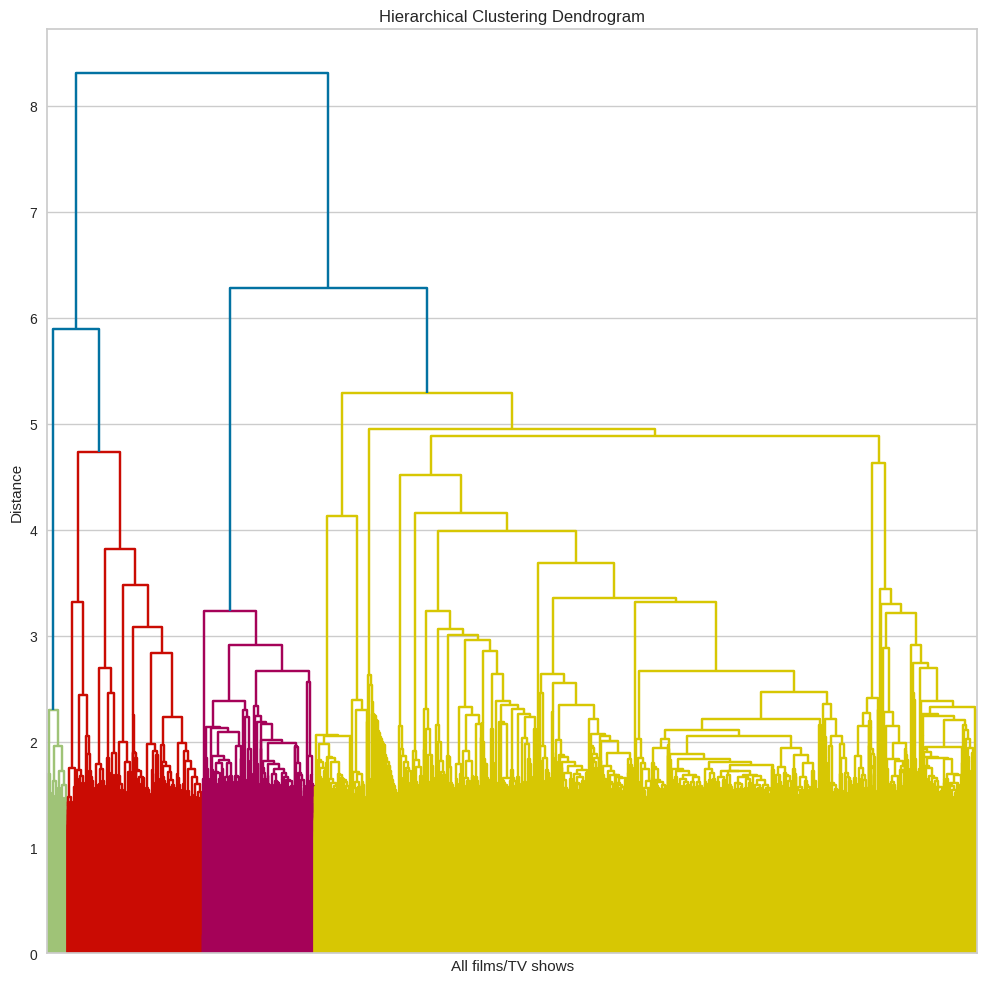

In [ ]:
# import libraries
from scipy.cluster.hierarchy import linkage, dendrogram

# HIERARCHICAL CLUSTERING
distances_linkage = linkage(X_transformed, method = 'ward', metric = 'euclidean')

plt.figure(figsize=(12, 12))

plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('All films/TV shows')
plt.ylabel('Distance')

dendrogram( distances_linkage, no_labels = True )

plt.show()

* A dendrogram is a tree-like diagram used to display the relationships between data points in a hierarchical clustering algorithm. It displays the distance between each pair of data points and how they are grouped into clusters.

* We used Dendrogram because dendrograms are a useful tool for visualizing hierarchical clustering results.

### ML Model - 3  Agglomerative Clustering

In [ ]:
# ML Model - 3 Implementation

k_range = range(5, 12)  ##Range selected from dendrogram above

In [ ]:
# Compute Silhouette score for each k
from sklearn.cluster import AgglomerativeClustering
for k in k_range:
    model = AgglomerativeClustering(n_clusters=k)
    labels = model.fit_predict(X_transformed)
    score = silhouette_score(X, labels)
    print("k=%d, Silhouette score=%f" % (k, score))

k=5, Silhouette score=0.000267
k=6, Silhouette score=0.000574
k=7, Silhouette score=0.001123
k=8, Silhouette score=0.000616
k=9, Silhouette score=0.001125
k=10, Silhouette score=0.001509
k=11, Silhouette score=0.001812


Here, we have the same number of clusters in k-means elbow method and agglomerative clustering i.e. 10, it means that both methods agreed on the optimal number of clusters for the given data. This might be a good sign that the chosen number of clusters is a good fit for the data.

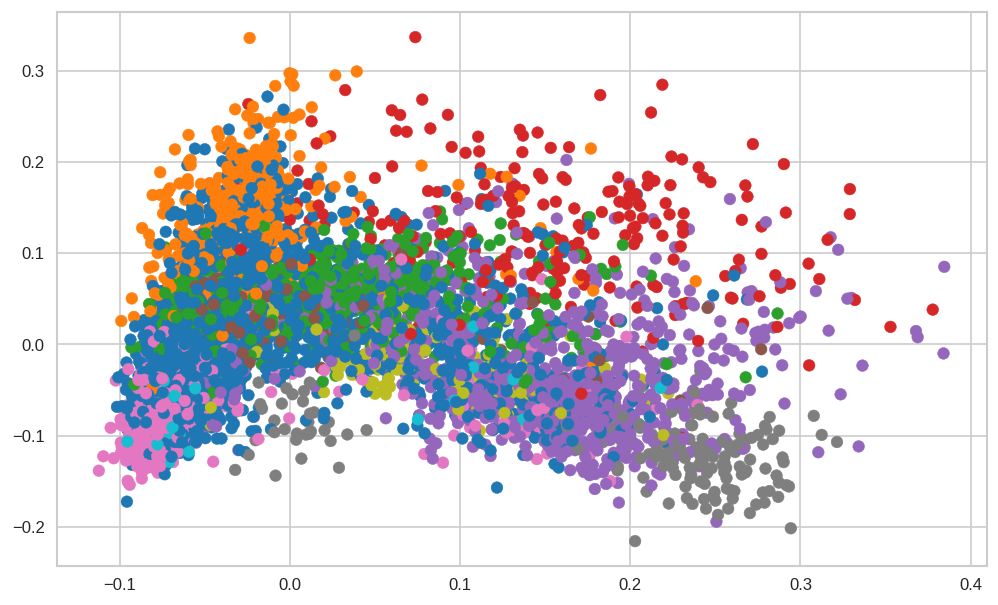

In [ ]:
from sklearn.cluster import AgglomerativeClustering
model = AgglomerativeClustering(n_clusters = 10, affinity = 'euclidean', linkage = 'ward')
labels = model.fit_predict(X_transformed)
# Create a scatter plot with different colors for different clusters
plt.figure(figsize=(10,6), dpi=120)
plt.scatter(X_transformed[:, 0], X_transformed[:, 1], c=labels, cmap='tab10')
plt.legend()
plt.show()

In [ ]:
data['cluster_number_agg_clustering'] = model.labels_

We have created a new column called "cluster_number_agg_clustering," which indicates which observations are assigned to which cluster.

In [ ]:
#word cloud for user rating review
def func_select_Category_agg_clustering(cluster_label,column_of_choice):
  df_word_cloud = data[['cluster_number_agg_clustering',column_of_choice]].dropna()
  df_word_cloud = df_word_cloud[df_word_cloud['cluster_number_agg_clustering']==cluster_label]
  text = " ".join(word for word in df_word_cloud[column_of_choice])
  # Create stopword list:
  stopwords = set(STOPWORDS)
  # Generate a word cloud image
  wordcloud = WordCloud(stopwords=stopwords, background_color="black").generate(text)
  # Plot the wordclouds
  plt.imshow(wordcloud, interpolation='blackman')
  plt.title(f'Cluster: {i}', fontsize=18, fontweight='bold')
  plt.axis("off")
  plt.show()

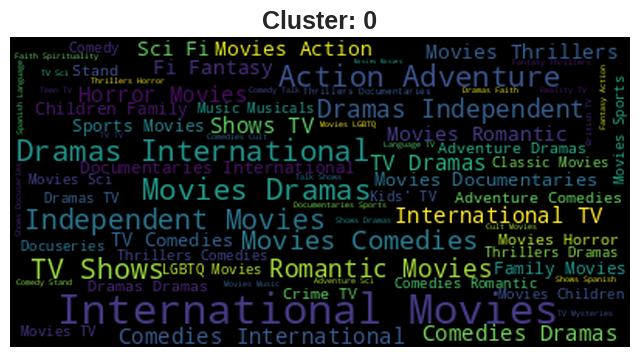

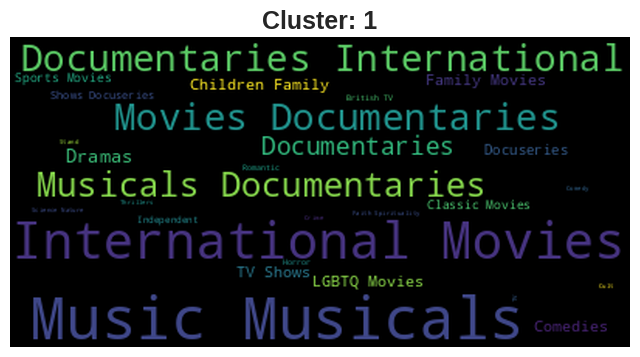

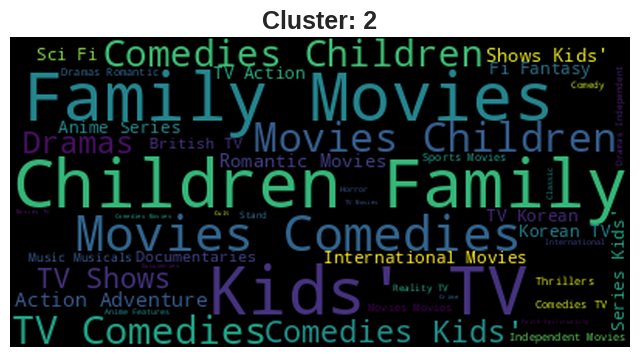

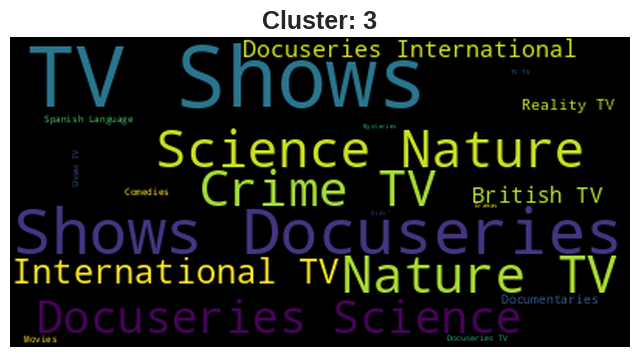

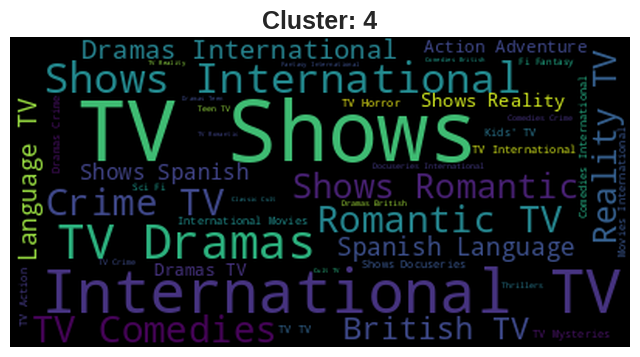

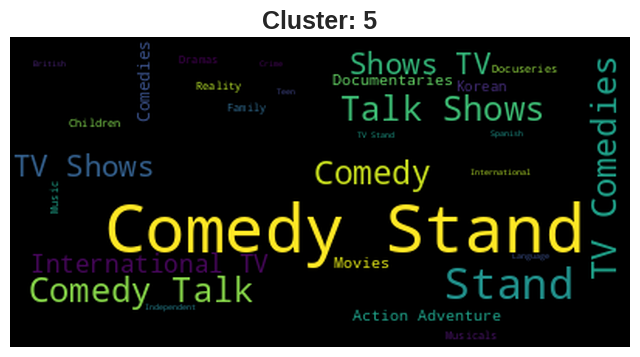

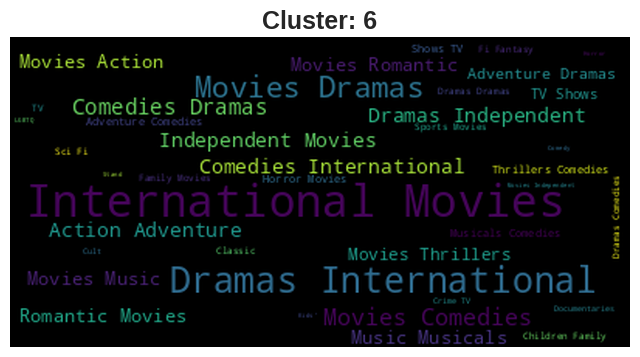

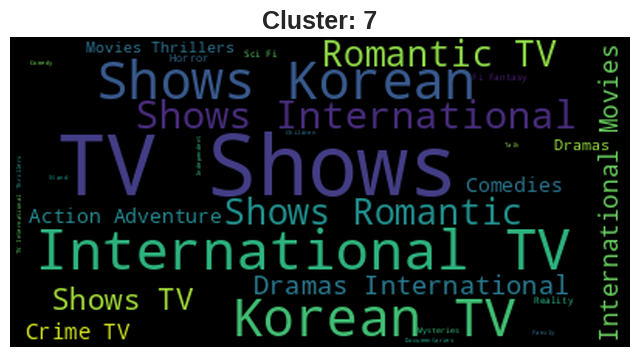

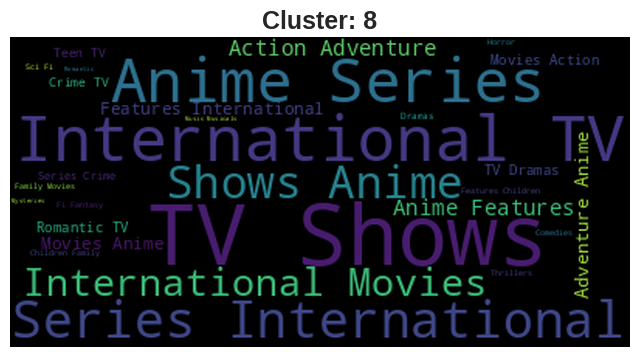

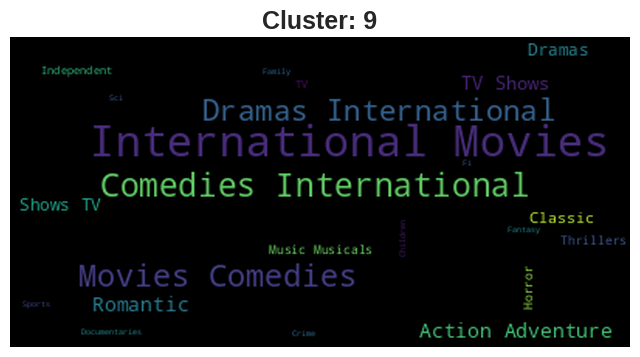

In [ ]:
for i in range(10):
  func_select_Category_agg_clustering(i,'listed_in')

Here again we have created thw word plot for our listed_in variable to check the distribution of words in different clusters. And we can see that

* Cluster 0 contains maximum no. of documentaries, musical, sports.
* Cluster 1 contains maximum no. of Independent, International, Horror movies.
* Cluster 2 contains max no of TV shows
* Cluster 3 conatins max no. of family, kids movies.
* Cluster 4 contains max no. of Korean, Crime thriller movies.
* Cluster 5 contains max no. of Standup comedy shows.
* Cluster 6 contains max no. of nature and science.]
* Cluster 7 contains max no. of Drama, Comedy and International movies.
* Cluster 8 contains max no. of Anime movies and anime series.
* Cluster 9 contains max no.of action, comedies, dramas and international movies.

## **Recommender System**

In [ ]:
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
#removing stopwords
tfidf = TfidfVectorizer(stop_words='english')

In [ ]:
#get the tf-idf scores
#create TF-IDF matrix by fitting and transforming the data
tfidf_matrix = tfidf.fit_transform(data['org_new'])

#shape of tfidf_matrix
tfidf_matrix.shape

(7770, 41973)

We'll use cosine similarity over tf-idf because-:
* Cosine similarity handles high dimensional sparse data better.

* Cosine similarity captures the meaning of the text better than tf-idf. For example, if two items contain similar words but in different orders, cosine similarity would still consider them similar, while tf-idf may not. This is because tf-idf only considers the frequency of words in a document and not their order or meaning.

### **Using Cosine Similarity**

Cosine similarity is a measure of similarity between two non-zero vectors in a multidimensional space. It measures the cosine of the angle between the two vectors, which ranges from -1 (opposite direction) to 1 (same direction), with 0 indicating orthogonality (the vectors are perpendicular to each other).

In this project we have used cosine similarity which is used to determine how similar two documents or pieces of text are. We represent the documents as vectors in a high-dimensional space, where each dimension represents a word or term in the corpus. We can then calculate the cosine similarity between the vectors to determine how similar the documents are based on their word usage.

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
cosine_sim = cosine_similarity(tfidf_matrix)

In [ ]:
programme_list=new_df['title'].to_list()

In [ ]:
def recommend(title, cosine_similarity=cosine_sim):
    index = programme_list.index(title)         #finds the index of the input title in the programme_list.
    sim_score = list(enumerate(cosine_sim[index])) #creates a list of tuples containing the similarity score and index between the input title and all other programmes in the dataset.

    #position 0 is the movie itself, thus exclude
    sim_score = sorted(sim_score, key= lambda x: x[1], reverse=True)[1:11]  #sorts the list of tuples by similarity score in descending order.
    recommend_index = [i[0] for i in sim_score]
    rec_movie = new_df['title'].iloc[recommend_index]
    rec_score = [round(i[1],4) for i in sim_score]
    rec_table = pd.DataFrame(list(zip(rec_movie,rec_score)), columns=['Recommended movie','Similarity(0-1)'])
    return rec_table


This function calculates the cosine similarity scores between the input title and all other titles in the dataset, sorts them in descending order, and returns the top 10 movies with the highest similarity scores as recommendations.

In [ ]:
recommend("Indiana Jones and the Last Crusade")

,Recommended movie,Similarity(0-1)
0,Indiana Jones and the Raiders of the Lost Ark,0.3147
1,Indiana Jones and the Kingdom of the Crystal S...,0.2001
2,Indiana Jones and the Temple of Doom,0.1944
3,Monty Python and the Holy Grail,0.1291
4,Lincoln,0.1276
5,A Bridge Too Far,0.1225
6,The Battle of Midway,0.1109
7,The Adventures of Tintin,0.1088
8,Pawn Stars,0.1085
9,Patriot Games,0.1026


In [ ]:
# save the function as a pickle file
import pickle
with open('recommend.pkl', 'wb') as f:
    pickle.dump(recommend, f)

In [ ]:
import pickle
with open('tfidf.pkl', 'wb') as f:
    pickle.dump(tfidf, f)

In [ ]:
with open('tfidf_matrix.pkl', 'wb') as f:
    pickle.dump(tfidf_matrix, f)

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7770 entries, 0 to 7786
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   show_id                        7770 non-null   object        
 1   type                           7770 non-null   object        
 2   title                          7770 non-null   object        
 3   director                       7770 non-null   object        
 4   cast                           7770 non-null   object        
 5   country                        7770 non-null   object        
 6   date_added                     7770 non-null   datetime64[ns]
 7   release_year                   7770 non-null   int64         
 8   rating                         7770 non-null   object        
 9   duration                       7770 non-null   int64         
 10  listed_in                      7770 non-null   object        
 11  description      

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

The aim of this project was to investigate how Netflix movies and TV shows could be categorized based on their attributes such as genre, director, and rating. We began by performing data wrangling, handling missing values, and conducting exploratory data analysis. Some key findings from our analysis are as follows:

1. The dataset contains more movies than TV shows. However, in recent years, Netflix has been focusing more on TV shows, indicating a shift in their content strategy.

2. The majority of the content on Netflix is rated as TV-MA (for mature audiences) and TV-14. This suggests that mature and moderately mature content is more popular among Netflix viewers.

3. The number of TV shows and movies on Netflix has significantly increased since 2010, indicating a growing library of content.

4. Genres such as documentaries, stand-up comedy, drama, international movies, and comedies are highly popular on the platform. This could be because viewers prefer content that is relatable and realistic.

5. The United States and India are the top countries producing content for Netflix, indicating a global reach and diverse content offerings.

6. The months of December and January see a high release of content on Netflix, suggesting a seasonal pattern in content additions.

7. Netflix has a significant amount of original content, accounting for over 30% of their library. This highlights the platform's investment in creating and promoting its own content.

8. The preferences of viewers in the United States and the United Kingdom align closely, indicating similar content choices between the two countries.

* We then performed textual data preprocessing, which involved merging important columns, lowercasing, removing punctuation and stopwords, text normalization through stemming and lemmatization, and text vectorization using TF-IDF. To reduce the dimensionality of the data, we applied PCA and retained 95% of the variance using 5000 components.

* In the clustering phase, we utilized various techniques such as silhouette score, k-means clustering, dendrograms, and agglomerative clustering. Based on our analysis, we determined that 10 clusters were the optimal choice.

* To visualize the distribution of genres and words across different clusters, we created word plots.

* Finally, we developed a recommender system using cosine similarity on the TF-IDF matrix. We evaluated the system's performance by inputting different movie names, and it produced satisfactory recommendations.

Overall, this project provided insights into how Netflix content can be categorized and recommended based on various attributes, contributing to a better understanding of user preferences and enhancing the viewing experience on the platform.







## **Future Scope**

* By integrating additional datasets, such as IMDB ratings and Rotten Tomatoes, with this dataset, we can uncover a multitude of fascinating insights.

* Further exploration in the clustering analysis can be done to experiment with alternative clustering algorithms like DBSCAN.

* Additional focus should be placed on enhancing the recommender system and developing a functional application based on this recommendation system.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***